### DATA DESCRIPTION 

#### Data Set Information:

Term deposits are a major source of income for a bank. A term deposit is a cash investment held at a financial institution. Your money is invested for an agreed rate of interest over a fixed amount of time, or term. The bank has various outreach plans to sell term deposits to their customers such as email marketing, advertisements, telephonic marketing, and digital marketing.

Telephonic marketing campaigns still remain one of the most effective way to reach out to people. However, they require huge investment as large call centers are hired to actually execute these campaigns. Hence, it is crucial to identify the customers most likely to convert beforehand so that they can be specifically targeted via call.

The data is related to direct marketing campaigns (phone calls) of a Portuguese banking institution. The classification goal is to predict if the client will subscribe to a term deposit (variable y).

The data is related with direct marketing campaigns of a Portuguese banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be ('yes') or not ('no') subscribed.

There are four datasets:

1) bank-additional-full.csv with all examples (41188) and 20 inputs, ordered by date (from May 2008 to November 20 [Moro et al., 2014]

2) bank-additional.csv with 10% of the examples (4119), randomly selected from 1), and 20 inputs.10), very close to the data analyzed in

3) bank-full.csv with all examples and 17 inputs, ordered by date (older version of this dataset with less inputs).

4) bank.csv with 10% of the examples and 17 inputs, randomly selected from 3 (older version of this dataset with less inputs).

The smallest datasets are provided to test more computationally demanding machine learning algorithms (e.g., SVM)

The classification goal is to predict if the client will subscribe (yes/no) a term deposit (variable y).


Input variables:

#### bank client data:

1 - age (numeric)

2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')

3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)

4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')

5 - default: has credit in default? (categorical: 'no','yes','unknown')

6 - housing: has housing loan? (categorical: 'no','yes','unknown')

7 - loan: has personal loan? (categorical: 'no','yes','unknown')

#### related with the last contact of the current campaign:

8 - contact: contact communication type (categorical: 'cellular','telephone')

9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')

10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')

11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

#### other attributes:

12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)

14 - previous: number of contacts performed before this campaign and for this client (numeric)

15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')

#### social and economic context attributes

16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)

17 - cons.price.idx: consumer price index - monthly indicator (numeric)

18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)

19 - euribor3m: euribor 3 month rate - daily indicator (numeric)

20 - nr.employed: number of employees - quarterly indicator (numeric)

#### Output variable (desired target):

21 - y - has the client subscribed a term deposit? (binary: 'yes','no')


### IMPORT REQUIRED PACKAGES

In [135]:
#!pip install catboost

In [2]:
import pandas as pd 
import numpy as np
import scipy 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import missingno as mnso
from sklearn.feature_selection import RFE
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error as MSE
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score
from sklearn.impute import KNNImputer
from sklearn.metrics import *
from dython.nominal import associations
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression,f_classif,mutual_info_classif, chi2
from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

from sklearn.neighbors import KNeighborsClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC, LinearSVC, SVR
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier 
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neural_network import MLPClassifier
from sklearn import metrics
import xgboost as xgb
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.svm import SVC
from sklearn.svm import OneClassSVM
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from imblearn.ensemble import BalancedBaggingClassifier
import optuna
from optuna.samplers import TPESampler
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold


### EXPLORING DATA

In [86]:
data=pd.read_csv('/Users/goncaavcicakmak/Desktop/ads-542-finalproject/data/bank-additional/bank-additional-full.csv' ,sep=';', header=0,)
data.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [87]:
data.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,41188.0,NaN,NaN,NaN,40.02406,10.42125,17.0,32.0,38.0,47.0,98.0
job,41188,12,admin.,10422,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,41188,4,married,24928,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,41188,8,university.degree,12168,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,41188,3,no,32588,NaN,NaN,NaN,NaN,NaN,NaN,NaN
housing,41188,3,yes,21576,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,41188,3,no,33950,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,41188,2,cellular,26144,NaN,NaN,NaN,NaN,NaN,NaN,NaN
month,41188,10,may,13769,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day_of_week,41188,5,thu,8623,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [88]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [89]:
# Change object data into Categorical
categoric_list= data.columns[data.dtypes == "object"].tolist()
for i in categoric_list:
    print(i)
    data[i] = data[i].astype("category")
    
data.info()
        

job
marital
education
default
housing
loan
contact
month
day_of_week
poutcome
y
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   age             41188 non-null  int64   
 1   job             41188 non-null  category
 2   marital         41188 non-null  category
 3   education       41188 non-null  category
 4   default         41188 non-null  category
 5   housing         41188 non-null  category
 6   loan            41188 non-null  category
 7   contact         41188 non-null  category
 8   month           41188 non-null  category
 9   day_of_week     41188 non-null  category
 10  duration        41188 non-null  int64   
 11  campaign        41188 non-null  int64   
 12  pdays           41188 non-null  int64   
 13  previous        41188 non-null  int64   
 14  poutcome        41188 non-null  category
 15  emp.var.rate    41188 no

In [90]:
# Numeric data
numeric_list=[]
for j in data:
    if data[j].dtype!='category':
        numeric_list.append(j)
print(numeric_list)
        

['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']


In [91]:
# Categoric data
category_list=[]
for j in data:
    if data[j].dtype=='category':
        category_list.append(j)
print(category_list)
        

['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y']


In [92]:
data

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


### VISUALIZATION OF DATA 

#### Correlation Heatmap of all type of variables

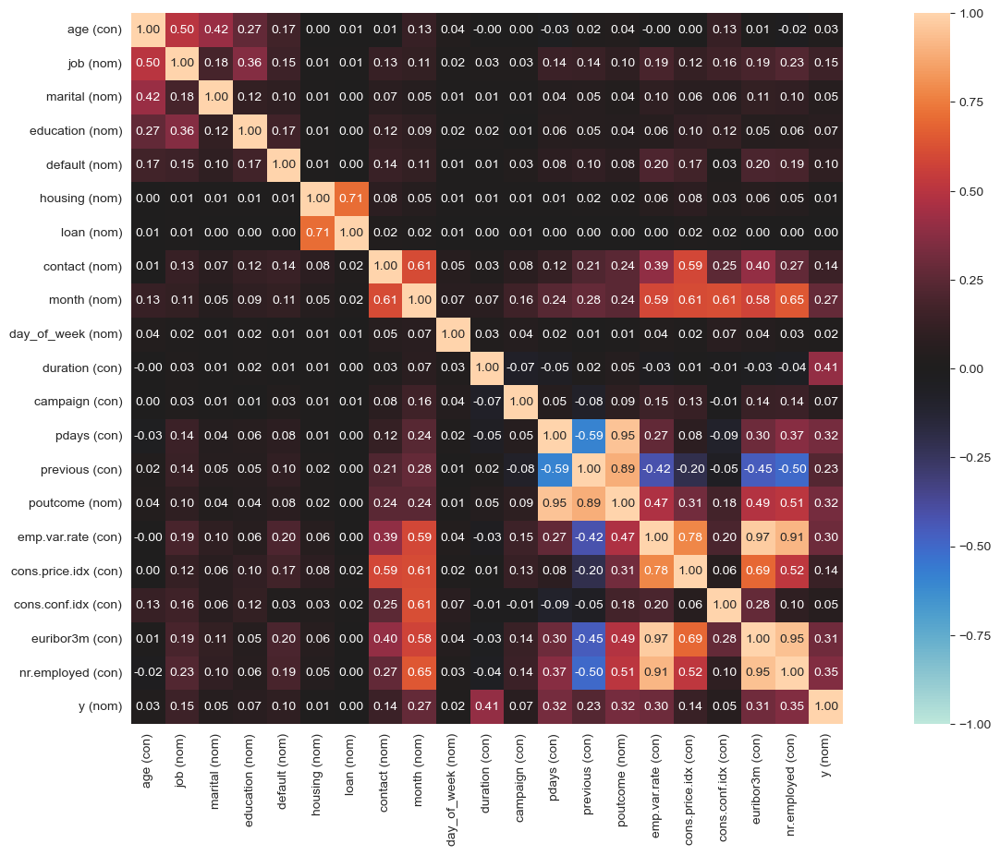

{'corr':                       age (con)  job (nom)  marital (nom)  education (nom)  \
 age (con)              1.000000   0.504788       0.418870         0.268502   
 job (nom)              0.504788   1.000000       0.183590         0.359526   
 marital (nom)          0.418870   0.183590       1.000000         0.116240   
 education (nom)        0.268502   0.359526       0.116240         1.000000   
 default (nom)          0.165022   0.152101       0.095434         0.170355   
 housing (nom)          0.001951   0.010630       0.009170         0.013316   
 loan (nom)             0.007368   0.010218       0.000000         0.000000   
 contact (nom)          0.007021   0.127856       0.071993         0.123302   
 month (nom)            0.126287   0.109835       0.050174         0.094718   
 day_of_week (nom)      0.037857   0.016458       0.010888         0.019725   
 duration (con)        -0.000866   0.028731       0.013022         0.018073   
 campaign (con)         0.004594   0.029969 

In [93]:
associations(data,figsize=(20,10),mark_columns=True)

**NOTE= there are high positive corelation between emp.var.rate, euribor3m,nr.employed and tehre medium negative corelation between nr.employed and previous then between pdays and previous**

#### Finding dependent variables corelation rate with dependent variable in descending order

In [94]:
#first copy data and use for label encoding
data_copy=data.copy()

In [95]:
# secondly, convert categorical y into numeric to find corelation 
le=LabelEncoder()
data_copy['y']=le.fit_transform(data_copy['y'])
data_copy['y'].dtype

dtype('int64')

In [96]:
# create corr matrix and ordered features according their ascending values 
corr_matrix = data_copy.corr()
a=corr_matrix["y"].sort_values(ascending=False)
print(a)

y                 1.000000
duration          0.405274
previous          0.230181
cons.conf.idx     0.054878
age               0.030399
campaign         -0.066357
cons.price.idx   -0.136211
emp.var.rate     -0.298334
euribor3m        -0.307771
pdays            -0.324914
nr.employed      -0.354678
Name: y, dtype: float64


**NOTE= duration has medium corelation between depended variable 'y' and there is no significant corelation with other features**

### CHECKING OUTLIERS 

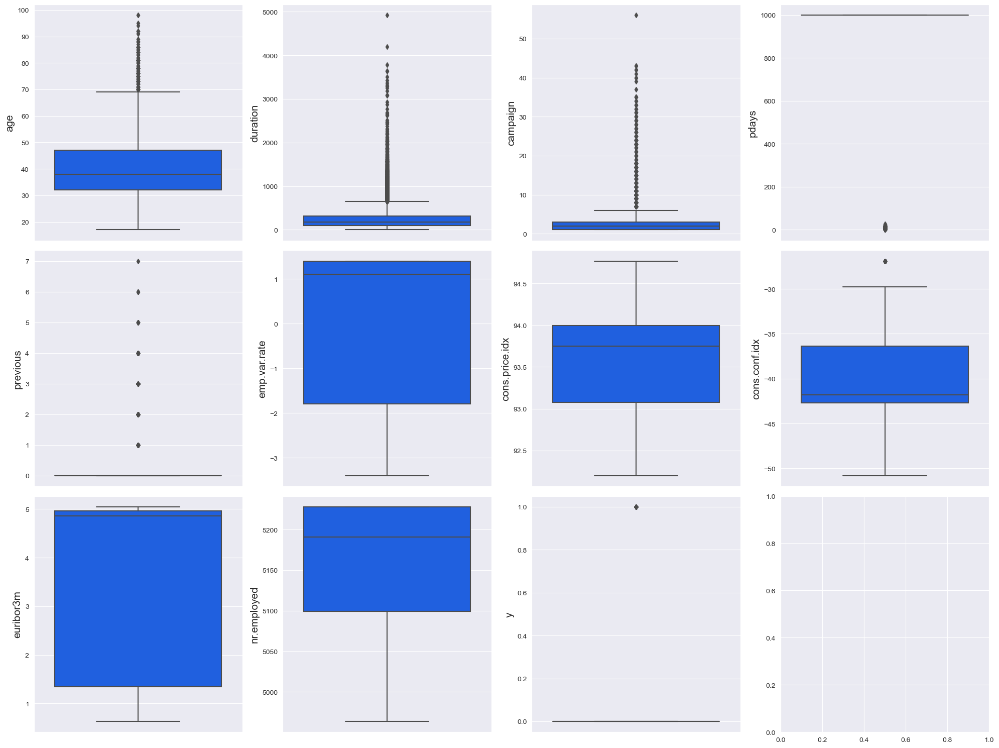

In [97]:
sns.set_style('darkgrid')
colors = ['#0055ff', '#ff7000']
CustomPalette = sns.set_palette(sns.color_palette(colors))
OrderedCols = data_copy.select_dtypes(exclude='category')
fig, ax = plt.subplots(3, 4, figsize=(20,15),dpi=100)

for i,col in enumerate(OrderedCols):
    x = i//4
    y = i%4

    sns.boxplot(data=data_copy, y=col, ax=ax[x,y])
    ax[x,y].yaxis.label.set_size(15)


plt.tight_layout()    
plt.show()

**NOTE= Duration and campaign have a lot of outlier therefore I build model with outliers and without outliers and compare and select the best from them**

### CAMPIGN AND Y RELATION ACCORDING TO EACH MONTHS

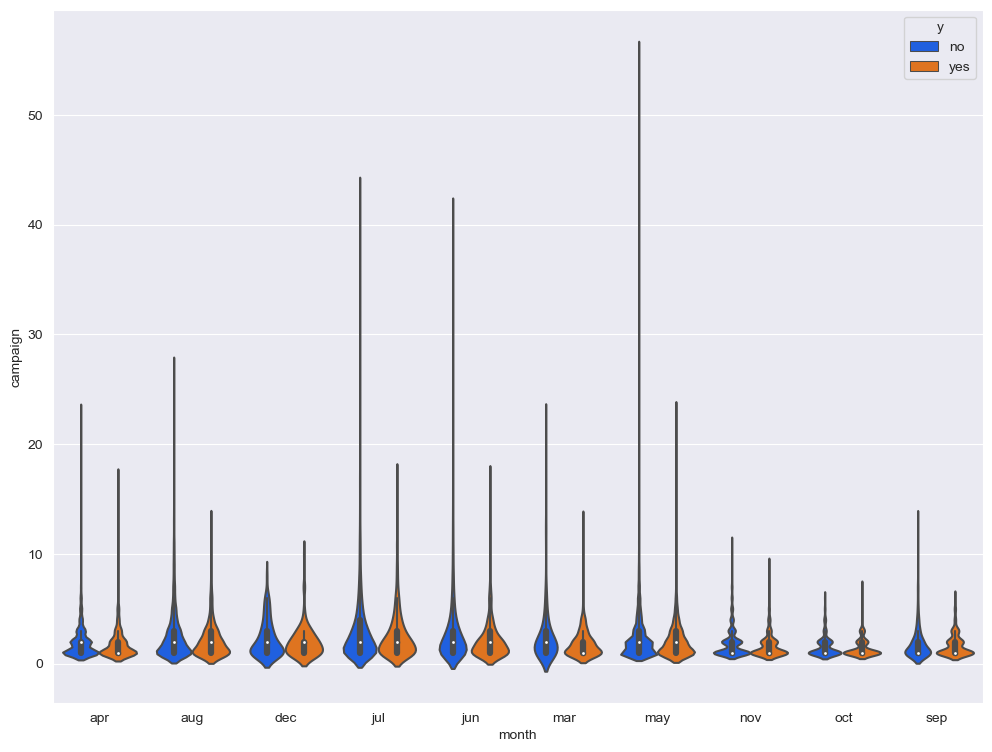

In [98]:
plt.figure(figsize=(12,9))
sns.violinplot(y='campaign', x='month',hue='y' ,data=data)
plt.show()

**NOTE= The violin graph tells Campaign has no effect on y**

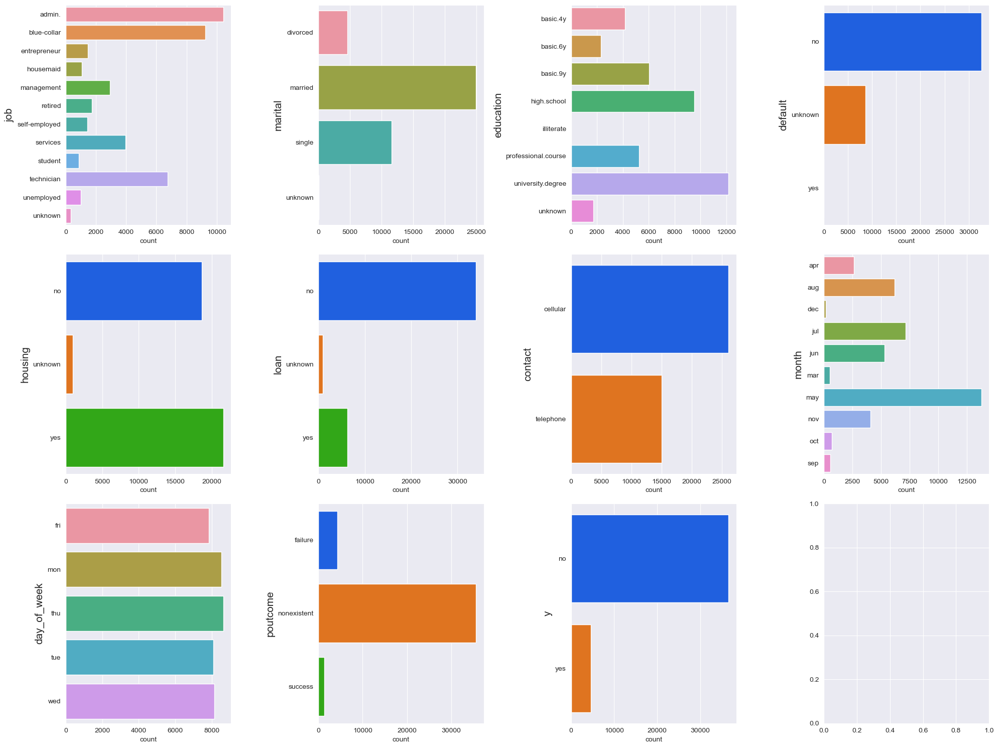

In [99]:
sns.set_style('darkgrid')
colors = ['#0055ff', '#ff7000', '#23bf00']
CustomPalette = sns.set_palette(sns.color_palette(colors))
OrderedCols = data.select_dtypes(include='category')
fig, ax = plt.subplots(3, 4, figsize=(20,15),dpi=100)

for i,col in enumerate(OrderedCols):
    x = i//4
    y = i%4

    sns.countplot(data=data, y=col, ax=ax[x,y])
    ax[x,y].yaxis.label.set_size(15)


plt.tight_layout()    
plt.show()

**NOTE= The figure above explains in poutcome there are too much nonexistent that means previous campaign did not applied.**

**People who do not have loan are considerable amount more than people who do have loan.** 

**People who have housing loan are higher than people who do not have housing loan.**

**Mostly admin, blue collar,techinican are called for term deposit.**

**As a contact type cellular is more preferable. Default includes almost no that means people do not have another loan.** 

**Most of people that are called for bank deposit are married besides People who have university degree and highschool degree are more preferable for asking bank deposit**

# MODELLING

In this section I try to find best score without any biases with trrying different types of classification model and processes.

In data yes 'y' is imbalanced depends on how many people say yes or no for bank deposit. Therefore I think dividing modellling into two part.

In part-1, I build classification models without balancing data but adjusting evaluating score metrics depend on imbalanced data.

In part-2, I will build model after balancing data.

To specify what will I do in modelling parts. Fisrtly, I will apply preprocessing ( Imputing missing data, Encoding categorical features, Dimension reduction ..). Following this I will try different types of base classification models (Random Forest, Logistic Regression,XGBoost..)and see which onescan give best score. After then picking best model types, I will apply Hyperparameter tuning (Optuna)to improve results of models. 

# PART-1 BUILD MODEL WITHOUT BALANCING DATA BUT ADJUST EVALUATING SCORES OF METRICS

In this section, I will build model after dropping all NaN values, encoding categorical values , apply classification models, choose the best 3 ones and define correct evaluation metrics for comparing the.

Also Using XGBoost (Extreme Gradient Boosting), TreeBased and specifically **BalancedBaggingClassifier** model can proper for imbalanced data because It is an advanced and more efficient implementation of gradient boosted decision trees designed for speed and performance. It is 10 times faster than the normal Gradient Boosting as it implements parallel processing. It is highly flexible as users can define custom optimization objectives and evaluation criteria, has an inbuilt mechanism to handle missing values. Unlike gradient boosting which stops splitting a node as soon as it encounters a negative loss, XG Boost splits up to the maximum depth specified and prunes the tree backward and removes splits beyond which there is an only negative loss. Extreme gradient boosting can be done using the XGBoost package in R and Python.

### 1.1 DATA CLEANING 

In [100]:
# See data is imbalanced or not:
data['y'].value_counts()

no     36548
yes     4640
Name: y, dtype: int64

### 1.1.1. Turn "unknown" into NaN for the aim of filling missing values

In [101]:
# Turn "unknown" into NaN for the aim of filling missing values:
data.replace("unknown", np.nan, inplace=True)

### 1.1.2. Transform pdays value 999 into 0 

In [102]:
#In pdays columns adding 999 for non called customers but it is a big number so I change with 0:
data['pdays']=data['pdays'].replace(999,0)


In [103]:
data.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,NaN,no,no,telephone,may,mon,...,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


### 1.1.3. Change columns values to delete punctuation on them

In [104]:
# CHANGE VALUE OF EDUCATION COLUMN WITH PROPER NAME ,ESCAPING PUNCTUATION ON THEM
data.education = data.education.replace( ['university.degree','high.school','basic.9y','professional.course','basic.4y','basic.6y','illiterate'],
                                        ['universitydegree','highschool','basic9y','professionalcourse','basic.y','basic6y','illiterate'] )

In [105]:
data.education.value_counts()

universitydegree      12168
highschool             9515
basic9y                6045
professionalcourse     5243
basic.y                4176
basic6y                2292
illiterate               18
Name: education, dtype: int64

In [106]:
# CHANGE VALUE OF JOB COLUMN WITH PROPER NAME ,ESCAPING PUNCTUATION ON THEM
data.job = data.job.replace( ['admin.','blue-collar','self-employed'],['admin','bluecollar','selfemployed'] )

In [107]:
data['job'].value_counts()

admin           10422
bluecollar       9254
technician       6743
services         3969
management       2924
retired          1720
entrepreneur     1456
selfemployed     1421
housemaid        1060
unemployed       1014
student           875
Name: job, dtype: int64

### 1.1.4 Drop unecessary columns

In [108]:
data_new=data.drop(['duration','month','day_of_week'],axis=1)
data_new.head()

,age,job,marital,education,default,housing,loan,contact,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.y,no,no,no,telephone,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,highschool,NaN,no,no,telephone,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,highschool,no,yes,no,telephone,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin,married,basic6y,no,no,no,telephone,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,highschool,no,no,yes,telephone,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [109]:
data_new.to_csv('/Users/goncaavcicakmak/Desktop/ads-542-finalproject/data/bank-additional/cleaned_data.csv')

### 1.1.5 Dropping Outliers

There are outliers in age and campaign features. I try to drop them 

#### Dropping Age Outlier

In [110]:
# IQR
Q1 = np.percentile(data_new['age'], 25)
Q3 = np.percentile(data_new['age'], 75)
IQR = Q3 - Q1
print(IQR)

15.0


In [111]:

# Above Upper bound
upper=Q3+1.5*IQR
upper_array=np.array(data_new['age']>=upper)
print("Upper Bound:",upper)
print(upper_array.sum())
 
#Below Lower bound
lower=Q1-1.5*IQR
lower_array=np.array(data_new['age']<=lower)
print("Lower Bound:",lower)
print(lower_array.sum())

Upper Bound: 69.5
469
Lower Bound: 9.5
0


<AxesSubplot:>

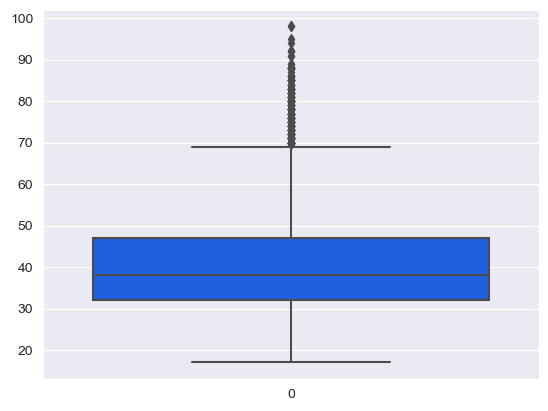

In [112]:
sns.boxplot(data_new['age'])

In [113]:
data_new2= data_new[data_new['age']<70]
data_new2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40719 entries, 0 to 41186
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   age             40719 non-null  int64   
 1   job             40395 non-null  category
 2   marital         40639 non-null  category
 3   education       39036 non-null  category
 4   default         32165 non-null  category
 5   housing         39738 non-null  category
 6   loan            39738 non-null  category
 7   contact         40719 non-null  category
 8   campaign        40719 non-null  int64   
 9   pdays           40719 non-null  int64   
 10  previous        40719 non-null  int64   
 11  poutcome        40719 non-null  category
 12  emp.var.rate    40719 non-null  float64 
 13  cons.price.idx  40719 non-null  float64 
 14  cons.conf.idx   40719 non-null  float64 
 15  euribor3m       40719 non-null  float64 
 16  nr.employed     40719 non-null  float64 
 17  y           

<AxesSubplot:>

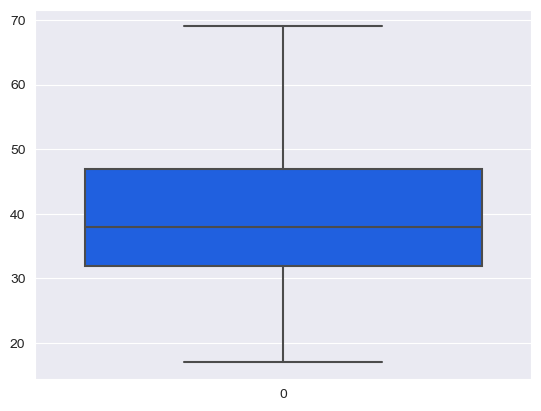

In [114]:
sns.boxplot(data_new2['age'])

#### Dropping Campaing Outliers

In [115]:
# IQR
Q1 = np.percentile(data_new['campaign'], 25)
Q3 = np.percentile(data_new['campaign'], 75)
IQR = Q3 - Q1
print(IQR)

2.0


In [116]:
# Above Upper bound
upper=Q3+1.5*IQR
upper_array=np.array(data_new['campaign']>=upper)
print("Upper Bound:",upper)
print(upper_array.sum())
 
#Below Lower bound
lower=Q1-1.5*IQR
lower_array=np.array(data_new['campaign']<=lower)
print("Lower Bound:",lower)
print(lower_array.sum())

Upper Bound: 6.0
3385
Lower Bound: -2.0
0


<AxesSubplot:>

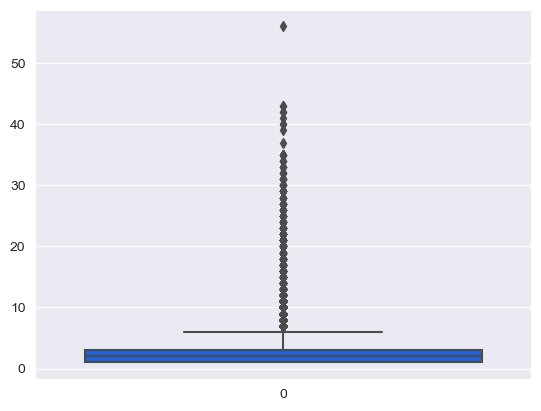

In [117]:
sns.boxplot(data_new2['campaign'])

In [120]:
data_new2= data_new[data_new['campaign']<8]
data_new2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39411 entries, 0 to 41187
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   age             39411 non-null  int64   
 1   job             39102 non-null  category
 2   marital         39339 non-null  category
 3   education       37763 non-null  category
 4   default         31264 non-null  category
 5   housing         38467 non-null  category
 6   loan            38467 non-null  category
 7   contact         39411 non-null  category
 8   campaign        39411 non-null  int64   
 9   pdays           39411 non-null  int64   
 10  previous        39411 non-null  int64   
 11  poutcome        39411 non-null  category
 12  emp.var.rate    39411 non-null  float64 
 13  cons.price.idx  39411 non-null  float64 
 14  cons.conf.idx   39411 non-null  float64 
 15  euribor3m       39411 non-null  float64 
 16  nr.employed     39411 non-null  float64 
 17  y           

<AxesSubplot:>

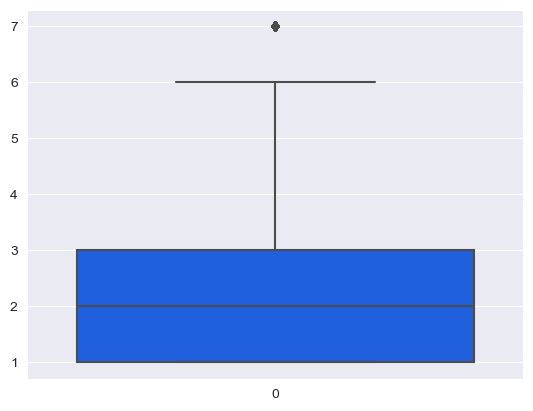

In [121]:
sns.boxplot(data_new2['campaign'])

In [122]:
data_new2.to_csv("/Users/goncaavcicakmak/Desktop/ads-542-finalproject/notebooks/train.csv")

NOTE= Classification models like XGBoost, GradientBoosting,RandomForest are robust to outliers It is not so important deleting outliers

### 1.2 DATA PREPROCESSING 

#### 1.2.1 ONEHOT ENCODING AND ORDINAL ENCODING

**I apply Onehot Encoding for turning  nominal categorical data ('marital','housing','loan','poutcome','y') into numeric.**

**Besides I apply OrdinalEncoding for turning ordinal categorical data (education, job) into numeric**

In [561]:
from sklearn.preprocessing import OrdinalEncoder 
onehot=OneHotEncoder()
ordinal=OrdinalEncoder()

In [562]:
# GET DUMMY FOR NOMINAL VARIABLES :

df_onehot=pd.get_dummies(data_new2[['contact','default','marital','housing','loan','poutcome','y']], drop_first=True)

In [563]:
df_ordinal=data_new2[['education', 'job']]

In [564]:
df_ordinal1=ordinal.fit_transform(df_ordinal)
df_ord=pd.DataFrame(data=df_ordinal1, columns=['education','job'])

In [565]:
numerics=[]
for i in data_new2:
    if data_new2[i].dtype != 'category':
        numerics.append(i)
print(numerics) 

['age', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']


In [566]:
df_del=pd.concat([df_ord,df_onehot,data_new2[numerics]], axis=1)
df_del.head()

,education,job,contact_telephone,default_yes,marital_married,marital_single,housing_yes,loan_yes,poutcome_nonexistent,poutcome_success,y_yes,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,0.0,3.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,56.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0
1,3.0,7.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,57.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0
2,3.0,7.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,37.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0
3,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,40.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0
4,3.0,7.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,56.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0


### 1.2.2 IMPUTING NAN VALUES 

In [567]:
import numpy as np
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(missing_values = np.nan,strategy ='most_frequent')

imputer = imputer.fit(df_del)
 
# Imputing the data    
df_del1 = imputer.transform(df_del)
df_del2=pd.DataFrame(data=df_del1,columns=df_del.columns)

In [568]:
df_del2.isnull().sum()

education               0
job                     0
contact_telephone       0
default_yes             0
marital_married         0
marital_single          0
housing_yes             0
loan_yes                0
poutcome_nonexistent    0
poutcome_success        0
y_yes                   0
age                     0
campaign                0
pdays                   0
previous                0
emp.var.rate            0
cons.price.idx          0
cons.conf.idx           0
euribor3m               0
nr.employed             0
dtype: int64

In [569]:
df_del2.head()

,education,job,contact_telephone,default_yes,marital_married,marital_single,housing_yes,loan_yes,poutcome_nonexistent,poutcome_success,y_yes,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,0.0,3.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,56.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0
1,3.0,7.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,57.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0
2,3.0,7.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,37.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0
3,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,40.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0
4,3.0,7.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,56.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0


#### Splitting data into train and test set

In [570]:
y=df_del2['y_yes']

In [571]:
X=df_del2.drop('y_yes',axis=1)

In [572]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, random_state=0)

### 1.3 Building models and compare their results

In [573]:
names = ['Logistic Regression', "KNN","Gradient Boosting", "Decision Tree", "RandomForest","XGB","CatBoost","LGBM", "BaggingClassifier","BalancedBaggingClassifier"]
classifiers = [LogisticRegression(solver='liblinear',random_state=42),
               KNeighborsClassifier(n_neighbors=3, weights= 'distance'),
               GradientBoostingClassifier(n_estimators=100, random_state=42),
               DecisionTreeClassifier(max_depth=5,  random_state=42),
               RandomForestClassifier(max_depth=5, n_estimators=100, random_state=42),
               xgb.XGBClassifier(n_estimators = 500,learning_rate = 0.05,use_label_encoder = False,n_jobs = -1),
               CatBoostClassifier(iterations=5, learning_rate=0.1),
               lgb.LGBMClassifier(n_estimators=1000, num_leaves=50),
               BaggingClassifier(random_state=0),
               BalancedBaggingClassifier(random_state=0)]

####  1.3.1 Choosing best three of them and Comparing their different types of Metric Scores 


To choose right evaluation metrics for imbalanced data, Popular alternatives are the precision and recall scores that allow the performance of the model to be considered by focusing on the minority class, called the positive class.

Precision calculates the ratio of the number of correctly predicted positive examples divided by the total number of positive examples that were predicted. Maximizing the precision will minimize the false positives.

Precision = TruePositives / (TruePositives + FalsePositives)

Recall predicts the ratio of the total number of correctly predicted positive examples divided by the total number of positive examples that could have been predicted. Maximizing recall will minimize false negatives.

Recall = TruePositives / (TruePositives + FalseNegatives)

The performance of a model can be summarized by a single score that averages both the precision and the recall, called the F-Measure. Maximizing the F-Measure will maximize both the precision and recall at the same time.

F1 = (2 * Precision * Recall) / (Precision + Recall)

In the above graph, It is understandbale which metrics can be used for our problem:

<p style="text-align:center;"><img src="https://machinelearningmastery.com/wp-content/uploads/2019/12/How-to-Choose-a-Metric-for-Imbalanced-Classification-latest.png" alt="Logo"></p>


Calculating F1, F0.5 and F2 :

F0.5-Measure (beta=0.5): More weight on precision, less weight on recall.
F1-Measure (beta=1.0): Balance the weight on precision and recall.
F2-Measure (beta=2.0): Less weight on precision, more weight on recall

F-Measure = (2 * Precision * Recall) / (Precision + Recall)

F0.5-Measure = (1.25 * Precision * Recall) / (0.25 * Precision + Recall)

F2-Measure = (5 * Precision * Recall) / (4 * Precision + Recall)

#### 1.3.2. HOW DECIDE WHICH METRIC IS THE BEST OUR PROBLEM

For our problem , It is crucial to identify the customers most likely to convert beforehand so that they can be specifically targeted via call. Hence, False positive is more costly because If We guess wrongly people who can not  take bank deposit but we say they can take the deposit there are to much wrong phone calls. 

Therefore It is the best choice to look F0.5 Score. The biggest F0.5 score is belongs to 

In [574]:
scores = []
f05_score=[]
for name, clf in zip(names, classifiers):
    clf.fit(X_train, y_train)
    score = clf.score(X_test,y_test)
    y_pred=clf.predict(X_test)
    f05=fbeta_score(y_test, y_pred, beta=0.5)
    scores.append(score)
    f05_score.append(f05)
    
scores_df = pd.DataFrame()


0:	learn: 0.6289175	total: 5.54ms	remaining: 22.1ms
1:	learn: 0.5760885	total: 8.51ms	remaining: 12.8ms
2:	learn: 0.5321421	total: 11.1ms	remaining: 7.4ms
3:	learn: 0.4956610	total: 13.7ms	remaining: 3.43ms
4:	learn: 0.4644634	total: 16.8ms	remaining: 0us


In [575]:
scores_df['name'] = names
scores_df['score'] = np.around(scores,3)
scores_df['f05']= np.around(f05_score,3)
scores_df.sort_values('score', ascending= False)

,name,score,f05
2,Gradient Boosting,0.908,0.576
3,Decision Tree,0.904,0.545
4,RandomForest,0.903,0.517
6,CatBoost,0.903,0.521
0,Logistic Regression,0.902,0.504
5,XGB,0.902,0.536
7,LGBM,0.898,0.512
8,BaggingClassifier,0.885,0.432
1,KNN,0.881,0.448
9,BalancedBaggingClassifier,0.831,0.390


### 1.3.3 Hyperparameter Tuning and Evaluation of  GRADIENT BOOSTING

### CONFUSION MATRIX FOR EVALUATING

A Confusion matrix is an N x N matrix used for evaluating the performance of a classification model, where N is the number of target classes. The matrix compares the actual target values with those predicted by the machine learning model.

<p style="text-align:center;"><img src="https://miro.medium.com/v2/resize:fit:1334/format:webp/1*3yGLac6F4mTENnj5dBNvNQ.jpeg" alt="Logo"></p>

<p style="text-align:center;"><img src="https://miro.medium.com/v2/resize:fit:1218/format:webp/1*jMs1RmSwnYgR9CsBw-z1dw.png" alt="Logo"></p>


 Understanding Confusion Matrix:
 
The following 4 are the basic terminology which will help us in determining the metrics we are looking for.

True Positives (TP): when the actual value is Positive and predicted is also Positive.
True negatives (TN): when the actual value is Negative and prediction is also Negative.
False positives (FP): When the actual is negative but prediction is Positive. Also known as the Type 1 error
False negatives (FN): When the actual is Positive but the prediction is Negative. Also known as the Type 2 error

A confusion matrix is a tabular summary of the number of correct and incorrect predictions made by a classifier. It is used to measure the performance of a classification model. It can be used to evaluate the performance of a classification model through the calculation of performance metrics like accuracy, precision, recall, and F1-score.

<p style="text-align:center;"><img src="https://miro.medium.com/v2/resize:fit:1400/format:webp/1*ZobYhjM4ZfK9eVXluecg3g.jpeg" alt="Logo"></p>
 

True Positive (TP) 

You predicted positive and it’s true. You predicted that an animal is a cat and it actually is.

True Negative (TN) 

You predicted negative and it’s true. You predicted that animal is not a cat and it actually is not (it’s a dog).

False Positive (Type 1 Error) (FP) 

You predicted positive and it’s false. You predicted that animal is a cat but it actually is not (it’s a dog).

False Negative (Type 2 Error) (FN) 

You predicted negative and it’s false. You predicted that animal is not a cat but it actually is.

#### 1.3.3. Hyperparameter Tuning of GRADIENT BOOSTING

In [576]:
from sklearn.metrics import make_scorer, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold,cross_validate
# Build model with parameters for Optuna
def objective(trial):

    param = {
        'subsample': trial.suggest_categorical('subsample', [0.5, 0.7, 1.0]),
        'learning_rate': trial.suggest_categorical('learning_rate', [0.0001, 0.001, 0.01, 0.1, 1.0]),
        'n_estimators': trial.suggest_categorical('n_estimators', [500,1000,1200,1500]),
        'max_depth': trial.suggest_categorical('max_depth', [3,5,7,10,12]), 
        'random_state': trial.suggest_categorical('random_state', [2023]),
    }
    grad =GradientBoostingClassifier(**param)  
    
    grad.fit(X_train,y_train) 

    
    preds = grad.predict(X_test)
    
    y_pred=grad.predict(X_test)
    f05=fbeta_score(y_test, y_pred, beta=0.5)

    return f05

In [577]:
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=5)
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)

[I 2023-05-26 16:29:36,351] A new study created in memory with name: no-name-ea5c96ed-cb9e-4110-92a6-7f5cfaa7fc2e
[I 2023-05-26 16:29:58,390] Trial 0 finished with value: 0.0 and parameters: {'subsample': 0.7, 'learning_rate': 0.0001, 'n_estimators': 500, 'max_depth': 7, 'random_state': 2023}. Best is trial 0 with value: 0.0.
[I 2023-05-26 16:30:50,756] Trial 1 finished with value: 0.0 and parameters: {'subsample': 0.5, 'learning_rate': 0.0001, 'n_estimators': 1500, 'max_depth': 7, 'random_state': 2023}. Best is trial 0 with value: 0.0.
[I 2023-05-26 16:31:16,812] Trial 2 finished with value: 0.5661764705882354 and parameters: {'subsample': 0.5, 'learning_rate': 1.0, 'n_estimators': 1500, 'max_depth': 3, 'random_state': 2023}. Best is trial 0 with value: 0.0.
[I 2023-05-26 16:32:59,848] Trial 3 finished with value: 0.0 and parameters: {'subsample': 1.0, 'learning_rate': 0.0001, 'n_estimators': 1200, 'max_depth': 10, 'random_state': 2023}. Best is trial 0 with value: 0.0.
[I 2023-05-26 

Number of finished trials: 5
Best trial: {'subsample': 0.7, 'learning_rate': 0.0001, 'n_estimators': 500, 'max_depth': 7, 'random_state': 2023}


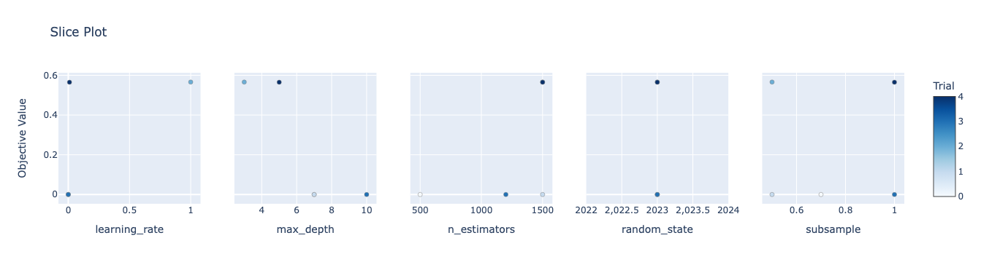

In [578]:
optuna.visualization.plot_slice(study)

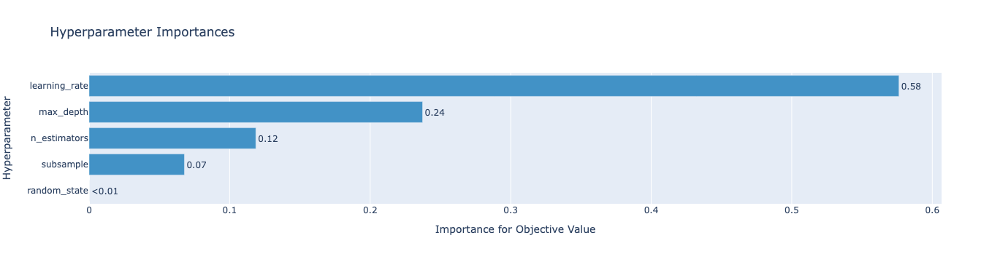

In [579]:
optuna.visualization.plot_param_importances(study)

#### 1.3.4 Build Best Gradient Boosting Model

In [580]:
Best_trial = study.best_trial.params
Best_trial

{'subsample': 0.7,
 'learning_rate': 0.0001,
 'n_estimators': 500,
 'max_depth': 7,
 'random_state': 2023}

In [581]:
bestgrad=XGBClassifier(**Best_trial)

In [582]:
bestgrad.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.0001, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=2023, ...)

In [583]:
y_pred = bestgrad.predict(X_test) 


In [584]:
f05=fbeta_score(y_test, y_pred, beta=0.5)
print(f05)

0.5368589743589745


### 1.3.5. Confusion Matrix of Gradient Boosting

In [585]:
cf =confusion_matrix(y_test,y_pred)

In [586]:
exp_series = pd.Series(y_test)
pred_series = pd.Series(y_pred)
pd.crosstab(exp_series, pred_series, rownames=['Actual'], colnames=['Predicted'],margins=True)

Predicted,0,1,All
Actual,,,
0.0,82,4,86
1.0,3,0,3
All,85,4,89


<AxesSubplot:>

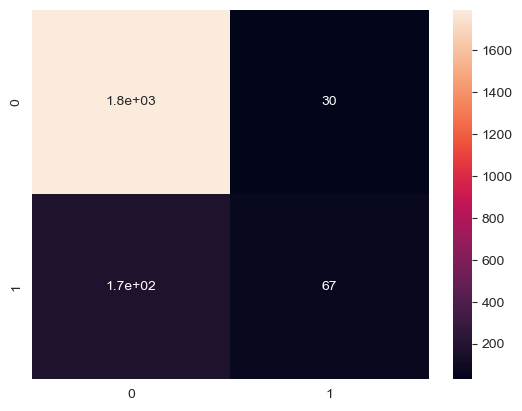

In [ ]:
import seaborn as sns
sns.heatmap(cf, annot=True)


### 1.3.6. ROC Curve Gradient Boosting

In [ ]:
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred)

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import scikitplot as skplt

y_proba = lgbm_model.predict_proba(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_proba[:, 1])
thresholds = thresholds[thresholds < 1]

fig = go.Figure()
fig.add_trace(go.Scatter(x=thresholds, y=tpr,
                    mode='lines+markers',
                    name='TPR'))
fig.add_trace(go.Scatter(x=thresholds, y=fpr,
                    mode='lines+markers',
                    name='FPR'))

fig.update_layout(
    title="TPR and FPR for different thresholds",
    xaxis_title="Threshold",
    yaxis_title="Metric value",    
)
fig.show()


### 1.3.7. Feature Importance

In [ ]:
from sklearn.metrics import cohen_kappa_score
cohen_kappa_score(val_y, val_prediction, weights = "quadratic")

In [ ]:
feature_importance = clf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
# plt.subplot(1, 2, 2)
plt.figure(figsize=(8, 18))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, tr_x.keys()[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

### 1.3.6 Checking other evaluation metrics for our best models.

In [588]:
# calculate the f0.5-measure
from sklearn.metrics import fbeta_score
def evaluate_model(model, X_train,y_train,X_test, y_test):
    from sklearn import metrics
    
    model.fit(X_train,y_train)
    # Predict Test Data 
    y_pred = model.predict(X_test)

    # Calculate accuracy, precision, recall, f1-score, and kappa score
    acc = metrics.accuracy_score(y_test, y_pred)
    prec = metrics.precision_score(y_test, y_pred)
    rec = metrics.recall_score(y_test, y_pred)
    f1 = metrics.f1_score(y_test, y_pred)
    kappa = metrics.cohen_kappa_score(y_test, y_pred)
    fbeta_score(y_test, y_pred, beta=0.5)
    fbeta_score(y_test, y_pred, beta=2.0)

    # Display confussion matrix
    cm = metrics.confusion_matrix(y_test, y_pred)

    return {'acc': acc, 'prec': prec, 'rec': rec, 'f1': f1, 'kappa': kappa,  'cm': cm}

In [589]:
evaluate_model(GradientBoostingClassifier(),X_train,y_train,X_test,y_test)

{'acc': 0.9082078678970374,
 'prec': 0.7473684210526316,
 'rec': 0.3008474576271186,
 'f1': 0.42900302114803623,
 'kappa': 0.3887895031954377,
 'cm': array([[1799,   24],
        [ 165,   71]])}

In [590]:
evaluate_model(lgb.LGBMClassifier(n_estimators=1000, num_leaves=50),X_train,y_train,X_test,y_test)

{'acc': 0.8980087421078193,
 'prec': 0.6048387096774194,
 'rec': 0.3177966101694915,
 'f1': 0.4166666666666667,
 'kappa': 0.3666582687868384,
 'cm': array([[1774,   49],
        [ 161,   75]])}

In [591]:
evaluate_model(xgb.XGBClassifier(n_estimators = 500,learning_rate = 0.05,use_label_encoder = False,n_jobs = -1),X_train,y_train,X_test,y_test)

{'acc': 0.9018941233608548,
 'prec': 0.646551724137931,
 'rec': 0.3177966101694915,
 'f1': 0.4261363636363636,
 'kappa': 0.3792416897506925,
 'cm': array([[1782,   41],
        [ 161,   75]])}

# PART-2 CLASSIFICATION OF IMBALANCED DATA WITH OVER SAMPLING

### 2.1 PREPROCESSING DATA

### 2.1.1 ONEHOT AND LABEL ENCODING

In [123]:
df=data_new2.copy()
df['y'].value_counts()

no     34844
yes     4567
Name: y, dtype: int64

In [124]:
df.to_csv("/Users/goncaavcicakmak/Desktop/adas-542-final-proje/train.csv")

In [125]:
# Note= Dataset is imbalance according to people say yes or no  for accepting  bank deposit.

#### 2.1.2 ONEHOT ENCODING FOR NOMINAL VARIABLES AND ORDINAL ENCODING FOR ORDINAL VARIABLES

In [126]:
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder,OneHotEncoder
onehot=OneHotEncoder()
ordinal=OrdinalEncoder()
label=LabelEncoder()

In [127]:
# GET DUMMY FOR NOMINAL VARIABLES :

df_onehot=pd.get_dummies(df[['contact','default','housing','loan','y']], drop_first=True)

In [128]:
df_ordinal=df[['education', 'job']]

In [129]:
df_lab=df[['marital','poutcome']]

In [130]:
df['poutcome'] = label.fit_transform(df['poutcome'])

In [131]:
df['marital'] = label.fit_transform(df['marital'])

In [132]:
df_ordinal=ordinal.fit_transform(df_ordinal)
df_ord=pd.DataFrame(data=df_ordinal, columns=['education','job'])

In [133]:
numerics=[]
for i in df:
    if df[i].dtype == 'category':
        numerics.append(i)
print(numerics)       

['job', 'education', 'default', 'housing', 'loan', 'contact', 'y']


In [134]:
numerics=[]
for i in df:
    if df[i].dtype != 'category':
        numerics.append(i)
print(numerics)  

['age', 'marital', 'campaign', 'pdays', 'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']


In [135]:
df2=pd.concat([df_ord,df_onehot,df[['age', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']]], axis=1)
df2.head()

,education,job,contact_telephone,default_yes,housing_yes,loan_yes,y_yes,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,0.0,3.0,1.0,0.0,0.0,0.0,0.0,56.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0
1,3.0,7.0,1.0,0.0,0.0,0.0,0.0,57.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0
2,3.0,7.0,1.0,0.0,1.0,0.0,0.0,37.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0
3,1.0,0.0,1.0,0.0,0.0,0.0,0.0,40.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0
4,3.0,7.0,1.0,0.0,0.0,1.0,0.0,56.0,1.0,0.0,0.0,1.1,93.994,-36.4,4.857,5191.0


In [82]:
df2.rename(columns = {'contact_telephone':'contact', 'default_yes':'default', 'loan_yes':'loan','housing_yes':'housing'}, inplace = True)

### 2.1.3. IMPUTING MISSING VALUES


In [136]:
df2.isnull().sum()

education            3413
job                  2074
contact_telephone    1765
default_yes          1765
housing_yes          1765
loan_yes             1765
y_yes                1765
age                  1765
campaign             1765
pdays                1765
previous             1765
emp.var.rate         1765
cons.price.idx       1765
cons.conf.idx        1765
euribor3m            1765
nr.employed          1765
dtype: int64

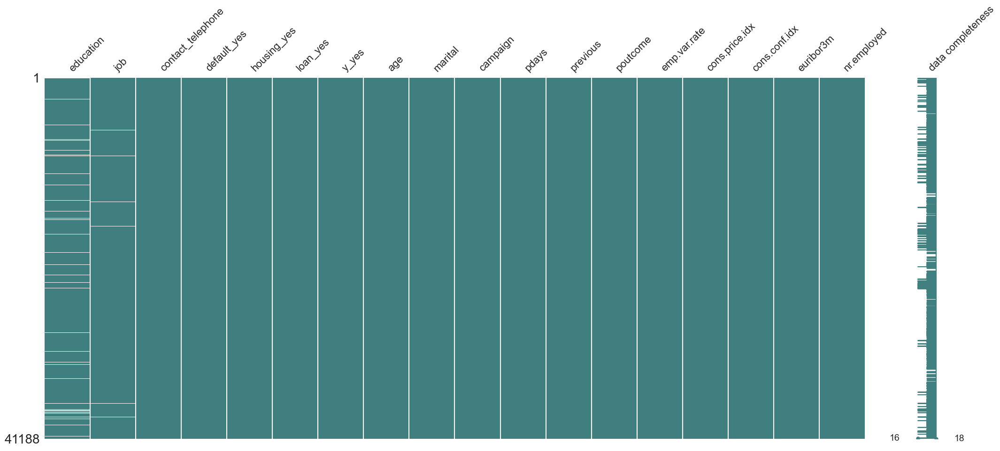

In [606]:
mnso.matrix(df2,labels=80,label_rotation=45,color=(0.25,0.50,0.50));plt.show()

#### Heatmap of Missing Values

Heatmap of missing value show the correlation between missing values of each variables. For example education and job have 0.2 corelattion so when education's missing value and job's missing value can be seen at the same time with 0.2 range


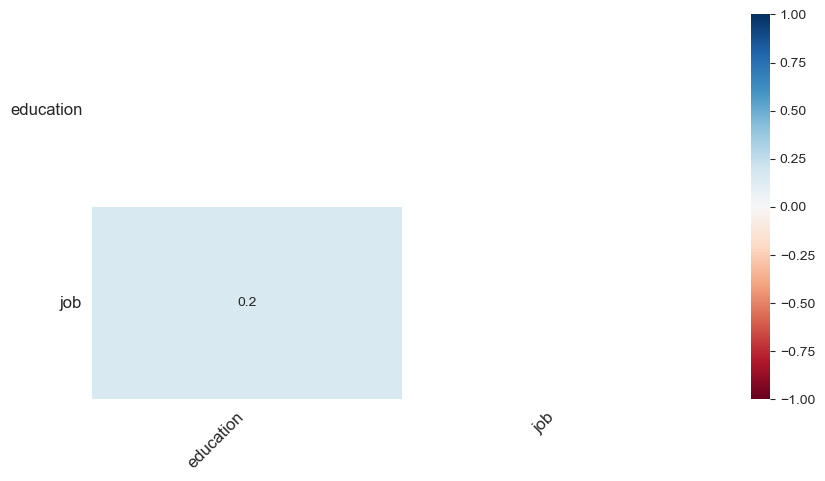

In [607]:
mnso.heatmap(df2, figsize=(10,5), fontsize=12);

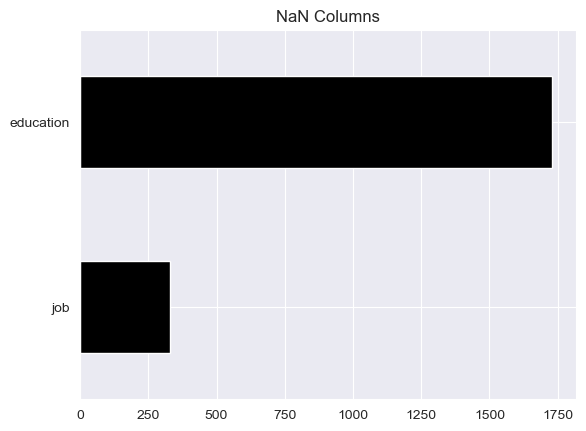

In [608]:
nans = df2.isnull().sum().sort_values()
nans = nans[nans>0]
nans.plot(kind="barh",color="black");plt.title("NaN Columns");plt.show()

### 2.1.3.1 RANDOMFOREST CLASSIFIER FOR FILLING MISSING VALUE OF EDUCATION COLUMN

There are missing value in education and job columns. First of all I impute missing value of education because of it has very much missings I impute missings with predicting whereby RANDOMFOREST CLASSIFIER. Then I will fill missing values of job with fillna becasue there is no too much missing value in jon columns.

I use Random Forest to fill education missing values because the most interesting approach is surely the predicting of missing values with a classification algorithm. This will give  the opportunity not to waste a good chunk of the dataset, and thus a large amount of information. If our predictions will be accurate enough, with this technique we should have the best scoring metrics.

Therefore:

- I have to split the dataset between rows with the column maker valorized, and rows with null values.

- the first dataframe will become the one on which we will create the classification model with the maker as target feature.

- use the model thus created to predict the missing values from the dataframe with null values

- merge the two dataframe into one


In [609]:
df_with_education = df2[df2['education'].notna()]
print("N. rows with education not null:", df_with_education.shape[0])

df_no_education = df2[df2['education'].isna()]
print("N. rows with education null:", df_no_education.shape[0])


N. rows with education not null: 39457
N. rows with education null: 1731


In [610]:
df_with_education

,education,job,contact_telephone,default_yes,housing_yes,loan_yes,y_yes,age,marital,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,0.0,3.0,1,0,0,0,0,56,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
1,3.0,7.0,1,0,0,0,0,57,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
2,3.0,7.0,1,0,1,0,0,37,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
3,1.0,0.0,1,0,0,0,0,40,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
4,3.0,7.0,1,0,0,1,0,56,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,5.0,5.0,0,0,1,0,1,73,1,1,0,0,1,-1.1,94.767,-50.8,1.028,4963.6
41184,5.0,1.0,0,0,0,0,0,46,1,1,0,0,1,-1.1,94.767,-50.8,1.028,4963.6
41185,6.0,5.0,0,0,1,0,0,56,1,2,0,0,1,-1.1,94.767,-50.8,1.028,4963.6
41186,5.0,9.0,0,0,0,0,1,44,1,1,0,0,1,-1.1,94.767,-50.8,1.028,4963.6


In [611]:
df_with_education.isnull().sum()

education              0
job                  199
contact_telephone      0
default_yes            0
housing_yes            0
loan_yes               0
y_yes                  0
age                    0
marital                0
campaign               0
pdays                  0
previous               0
poutcome               0
emp.var.rate           0
cons.price.idx         0
cons.conf.idx          0
euribor3m              0
nr.employed            0
dtype: int64

In [612]:
df_with_education.fillna(method ='ffill', inplace = True)

In [613]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score

X = df_with_education.drop("education", axis=1).values
Y = df_with_education["education"].values

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.1, random_state=0)



In [614]:
forest = RandomForestClassifier(n_estimators=45, max_depth=25, random_state=False, 
                                max_features=0.6, min_samples_leaf=3, n_jobs=-1)

forest.fit(X_train, Y_train)

y_pred_train = forest.predict(X_train)
y_pred = forest.predict(X_test)

y_pred_proba = forest.predict_proba(X_test)

accuracy_train = accuracy_score(Y_train, y_pred_train)
accuracy_test = accuracy_score(Y_test, y_pred)

print("ACCURACY: TRAIN=%.4f TEST=%.4f" % (accuracy_train,accuracy_test))
print("LOG LOSS: "+str(log_loss(Y_test, y_pred_proba)))


ACCURACY: TRAIN=0.7798 TEST=0.5606
LOG LOSS: 1.285706365617406


In [615]:

df_no_education_pred = df_no_education.drop('education', axis=1)
df_no_education_pred.fillna(method ='ffill', inplace = True)


In [616]:
prediction = forest.predict(df_no_education_pred)

In [617]:
prediction

array([2., 2., 5., ..., 5., 6., 3.])

In [618]:
df_no_education['education']=prediction

In [619]:
frames = [df_with_education, df_no_education]
df_final = pd.concat(frames)

In [627]:
df_final.head()

,education,job,contact_telephone,default_yes,housing_yes,loan_yes,y_yes,age,marital,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,0.0,3.0,1,0,0,0,0,56,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
1,3.0,7.0,1,0,0,0,0,57,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
2,3.0,7.0,1,0,1,0,0,37,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
3,1.0,0.0,1,0,0,0,0,40,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
4,3.0,7.0,1,0,0,1,0,56,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0


### 2.1.3.2. Filling Missing Vlaues of Job Column

In [628]:
df_final.fillna(method ='ffill', inplace = True)

In [629]:
df_final.isnull().sum()

education            0
job                  0
contact_telephone    0
default_yes          0
housing_yes          0
loan_yes             0
y_yes                0
age                  0
marital              0
campaign             0
pdays                0
previous             0
poutcome             0
emp.var.rate         0
cons.price.idx       0
cons.conf.idx        0
euribor3m            0
nr.employed          0
dtype: int64

### 2.2. FEATURE SELECTION 

#### 2.2.1. DIMENSION REDUCTION 
I will try 3 different way for feature selection and then pick one that has best result.

Principal component analysis (PCA) is a popular technique for analyzing large datasets containing a high number of dimensions/features per observation, increasing the interpretability of data while preserving the maximum amount of information, and enabling the visualization of multidimensional data.

(t-SNE) t-Distributed Stochastic Neighbor Embedding is a non-linear dimensionality reduction algorithm used for exploring high-dimensional data. It maps multi-dimensional data to two or more dimensions suitable for human observation. With help of the t-SNE algorithms, you may have to plot fewer exploratory data analysis plots next time you work with high dimensional data.

TruncatedSVD, performs linear dimensionality reduction by means of truncated singular value decomposition (SVD). Contrary to PCA, this estimator does not center the data before computing the singular value decomposition. This means it can work with sparse matrices efficiently.



In [60]:
df4=df_final.copy()

In [62]:
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import PCA
X = df4.drop('y_yes', axis = 1)
y = df4['y_yes']
X_tsne = TSNE(n_components = 2, random_state = 34).fit_transform(X)
X_pca = PCA(n_components = 2, random_state = 34).fit_transform(X)
X_svd = TruncatedSVD(n_components = 2, random_state = 34).fit_transform(X)

In [63]:
X_pca.shape

(41188, 2)

In [64]:
X_tsne.shape

(41188, 2)

In [65]:
X_svd.shape

(41188, 2)

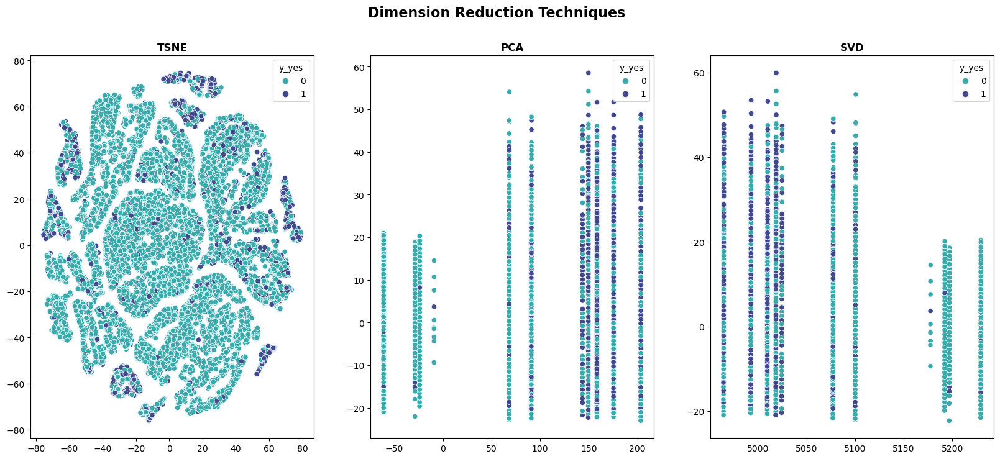

In [66]:
fig, ax = plt.subplots(1,3, figsize = (20,8))
sns.scatterplot(x=X_tsne[:,0], y=X_tsne[:,1], hue = y, ax = ax[0], palette = 'mako_r')
ax[0].set_title('TSNE', weight =  'bold')
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue = y, ax = ax[1], palette = 'mako_r')
ax[1].set_title('PCA', weight =  'bold')
sns.scatterplot(x=X_svd[:,0],y= X_svd[:,1], hue = y, ax = ax[2], palette = 'mako_r')
ax[2].set_title('SVD', weight =  'bold')
fig.suptitle('Dimension Reduction Techniques', fontsize = 16, weight = 'bold') 
plt.show()

NOTE= As seen from above graph any type of dimension reduction do not give a meaningful classification 

In [110]:
X_tsne = TSNE(n_components = 3, random_state = 34).fit_transform(X)
X_pca = PCA(n_components = 3, random_state = 34).fit_transform(X)
X_svd = TruncatedSVD(n_components = 3, random_state = 34).fit_transform(X)

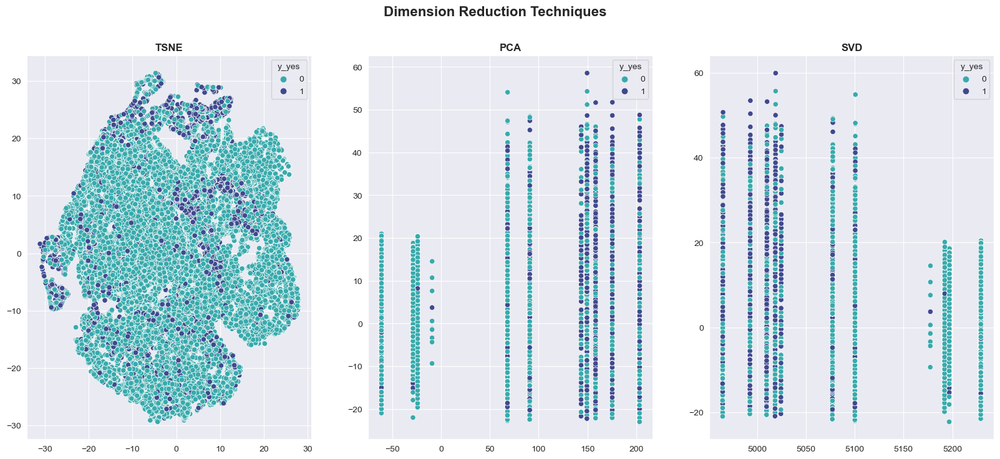

In [111]:
fig, ax = plt.subplots(1,3, figsize = (20,8))
sns.scatterplot(x=X_tsne[:,0], y=X_tsne[:,1], hue = y, ax = ax[0], palette = 'mako_r')
ax[0].set_title('TSNE', weight =  'bold')
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue = y, ax = ax[1], palette = 'mako_r')
ax[1].set_title('PCA', weight =  'bold')
sns.scatterplot(x=X_svd[:,0],y= X_svd[:,1], hue = y, ax = ax[2], palette = 'mako_r')
ax[2].set_title('SVD', weight =  'bold')
fig.suptitle('Dimension Reduction Techniques', fontsize = 16, weight = 'bold') 
plt.show()

**NOTE= For dimension=3 There is no meaningfull classification**

In [112]:
#X_tsne = TSNE(n_components = 4, method='exact' ,random_state = 34).fit_transform(X)
X_pca = PCA(n_components = 4, random_state = 34).fit_transform(X)
X_svd = TruncatedSVD(n_components = 4, random_state = 34).fit_transform(X)

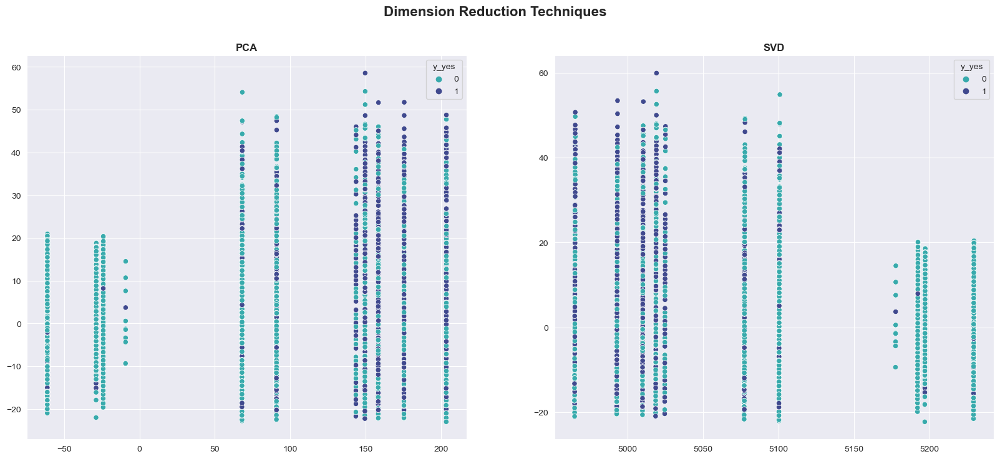

In [113]:
fig, ax = plt.subplots(1,2, figsize = (20,8))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue = y, ax = ax[0], palette = 'mako_r')
ax[0].set_title('PCA', weight =  'bold')
sns.scatterplot(x=X_svd[:,0],y= X_svd[:,1], hue = y, ax = ax[1], palette = 'mako_r')
ax[1].set_title('SVD', weight =  'bold')
fig.suptitle('Dimension Reduction Techniques', fontsize = 16, weight = 'bold') 
plt.show()

In [114]:

X_pca = PCA(n_components = 10, random_state = 34).fit_transform(X)
X_svd = TruncatedSVD(n_components = 10, random_state = 34).fit_transform(X)

fig, ax = plt.subplots(1,2, figsize = (20,8))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue = y, ax = ax[0], palette = 'mako_r')
ax[0].set_title('PCA', weight =  'bold')
sns.scatterplot(x=X_svd[:,0],y= X_svd[:,1], hue = y, ax = ax[1], palette = 'mako_r')
ax[1].set_title('SVD', weight =  'bold')
fig.suptitle('Dimension Reduction Techniques', fontsize = 16, weight = 'bold') 
plt.show()

## NOTE= All dimension reduction calculation above do not find meaningfull classification reduction of X so I decided not to use them

### 2.2.2 SELECT BEST FEATURE

Feature selection is a technique where we choose those features in our data that contribute most to the target variable. In other words we choose the best predictors for the target variable.

The classes in the sklearn.feature_selection module can be used for feature selection/dimensionality reduction on sample sets, either to improve estimators’ accuracy scores or to boost their performance on very high-dimensional datasets.

Advantage: Refer this link for a nice article on this by Jason Brownlee

Reduces Overfitting: Less redundant data means less possibility of making decisions based on redundant data/noise.
Improves Accuracy: Less misleading data means modeling accuracy improves.
Reduces Training Time: Less data means that algorithms train faster.

In [623]:
from sklearn.feature_selection import SelectKBest, chi2, f_regression

#### 2.2.2.1. Split Categorical Features 

In [639]:
numerics=[]
for i in data_new:
    if data_new[i].dtype == 'category':
        numerics.append(i)
print(numerics) 

['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'poutcome', 'y']


In [632]:
y=df_final['y_yes']

In [633]:
X_cat=df_final.drop(['age', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed','y_yes'],axis=1)

In [634]:
selector=SelectKBest(score_func=chi2,k=5)
selector.fit_transform(X_cat,y)

array([[0., 3., 1., 1., 1.],
       [3., 7., 1., 1., 1.],
       [3., 7., 1., 1., 1.],
       ...,
       [5., 9., 0., 1., 1.],
       [6., 9., 0., 1., 0.],
       [3., 8., 0., 2., 0.]])

In [635]:
cols_idxs = selector.get_support(indices=True)
X_cat_new = X_cat.iloc[:,cols_idxs]

In [636]:
X_cat_new.head()

,education,job,contact_telephone,marital,poutcome
0,0.0,3.0,1,1,1
1,3.0,7.0,1,1,1
2,3.0,7.0,1,1,1
3,1.0,0.0,1,1,1
4,3.0,7.0,1,1,1


#### 2.2.2.2. Split Categorical Features

In [638]:
df_final.columns

Index(['education', 'job', 'contact_telephone', 'default_yes', 'housing_yes',
       'loan_yes', 'y_yes', 'age', 'marital', 'campaign', 'pdays', 'previous',
       'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed'],
      dtype='object')

In [641]:
X_reg=df_final.drop([ 'job', 'marital', 'education', 'default_yes', 'housing_yes', 'loan_yes', 'contact_telephone', 'poutcome', 'y_yes'],axis=1)


In [642]:
selector_reg=SelectKBest(score_func=f_regression, k=5)
selector_reg.fit_transform(X_reg,y)

array([[ 0.0000e+00,  0.0000e+00,  1.1000e+00,  4.8570e+00,  5.1910e+03],
       [ 0.0000e+00,  0.0000e+00,  1.1000e+00,  4.8570e+00,  5.1910e+03],
       [ 0.0000e+00,  0.0000e+00,  1.1000e+00,  4.8570e+00,  5.1910e+03],
       ...,
       [ 0.0000e+00,  0.0000e+00, -1.1000e+00,  1.0460e+00,  4.9636e+03],
       [ 0.0000e+00,  1.0000e+00, -1.1000e+00,  1.0410e+00,  4.9636e+03],
       [ 0.0000e+00,  2.0000e+00, -1.1000e+00,  1.0310e+00,  4.9636e+03]])

In [643]:
cols_idxs = selector_reg.get_support(indices=True)
X_reg_new = X_reg.iloc[:,cols_idxs]

In [644]:
X_reg_new.head()

,pdays,previous,emp.var.rate,euribor3m,nr.employed
0,0,0,1.1,4.857,5191.0
1,0,0,1.1,4.857,5191.0
2,0,0,1.1,4.857,5191.0
3,0,0,1.1,4.857,5191.0
4,0,0,1.1,4.857,5191.0


### 2.2.2.3.DataFrame with Selected Features

In [645]:
result = pd.concat([X_reg_new,X_cat_new], axis=1, join='inner')
result .head()

,pdays,previous,emp.var.rate,euribor3m,nr.employed,education,job,contact_telephone,marital,poutcome
0,0,0,1.1,4.857,5191.0,0.0,3.0,1,1,1
1,0,0,1.1,4.857,5191.0,3.0,7.0,1,1,1
2,0,0,1.1,4.857,5191.0,3.0,7.0,1,1,1
3,0,0,1.1,4.857,5191.0,1.0,0.0,1,1,1
4,0,0,1.1,4.857,5191.0,3.0,7.0,1,1,1


### Comparing SelectkBest dataframe and data that has all features

#### Model Evaluation of Data that has all features

In [682]:
y=df_final['y_yes']

In [683]:
X=df_final.drop(['y_yes'],axis=1)

In [684]:
X_train, X_test, y_train, y_test = train_test_split(X ,y, test_size=0.05, random_state=0)

In [685]:
names = ['Logistic Regression', "KNN","Gradient Boosting", "Decision Tree", "RandomForest","XGB","CatBoost","LGBM", "BaggingClassifier","BalancedBaggingClassifier"]
classifiers = [LogisticRegression(solver='liblinear',random_state=42),
               KNeighborsClassifier(n_neighbors=3, weights= 'distance'),
               #SVC(kernel="linear", C=0.025, random_state=42),
               GradientBoostingClassifier(n_estimators=100, random_state=42),
               DecisionTreeClassifier(max_depth=5,  random_state=42),
               RandomForestClassifier(max_depth=5, n_estimators=100, random_state=42),
               xgb.XGBClassifier(n_estimators = 500,learning_rate = 0.05,use_label_encoder = False,n_jobs = -1),
               CatBoostClassifier(iterations=5, learning_rate=0.1),
               lgb.LGBMClassifier(n_estimators=1000, num_leaves=50),
               BaggingClassifier(random_state=0),
               BalancedBaggingClassifier(random_state=0)]

In [686]:
from sklearn.metrics import f1_score
scores = []
f1_sc=[]
for name, clf in zip(names, classifiers):
    clf.fit(X_train, y_train)
    score = clf.score(X_test,y_test)
    y_pred=clf.predict(X_test)
    f1= f1_score(y_test, y_pred, average='weighted')
    scores.append(score)
    f1_sc.append(f1)
    
scores_df = pd.DataFrame()

0:	learn: 0.6288064	total: 2.83ms	remaining: 11.3ms
1:	learn: 0.5769828	total: 5.21ms	remaining: 7.82ms
2:	learn: 0.5335114	total: 7.57ms	remaining: 5.04ms
3:	learn: 0.4971852	total: 10.1ms	remaining: 2.52ms
4:	learn: 0.4660234	total: 12.8ms	remaining: 0us


In [687]:
scores_df['name'] = names
scores_df['score'] = np.around(scores,3)
scores_df['f1']= np.around(f1_sc,3)
scores_df.sort_values('score', ascending= False)

,name,score,f1
4,RandomForest,0.909,0.888
6,CatBoost,0.908,0.886
0,Logistic Regression,0.907,0.885
3,Decision Tree,0.907,0.891
2,Gradient Boosting,0.905,0.889
7,LGBM,0.902,0.891
5,XGB,0.900,0.886
1,KNN,0.888,0.882
8,BaggingClassifier,0.886,0.876
9,BalancedBaggingClassifier,0.817,0.841


#### Model Evaluation of SelectkBest Dataframe

In [674]:
y=df_final['y_yes']

In [675]:
X=result

In [678]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, random_state=0)

In [679]:
names = ['Logistic Regression', "KNN","Gradient Boosting", "Decision Tree", "RandomForest","XGB","CatBoost","LGBM", "BaggingClassifier","BalancedBaggingClassifier"]
classifiers = [LogisticRegression(solver='liblinear',random_state=42),
               KNeighborsClassifier(n_neighbors=3, weights= 'distance'),
               #SVC(kernel="linear", C=0.025, random_state=42),
               GradientBoostingClassifier(n_estimators=100, random_state=42),
               DecisionTreeClassifier(max_depth=5,  random_state=42),
               RandomForestClassifier(max_depth=5, n_estimators=100, random_state=42),
               xgb.XGBClassifier(n_estimators = 500,learning_rate = 0.05,use_label_encoder = False,n_jobs = -1),
               CatBoostClassifier(iterations=5, learning_rate=0.1),
               lgb.LGBMClassifier(n_estimators=1000, num_leaves=50),
               BaggingClassifier(random_state=0),
               BalancedBaggingClassifier(random_state=0)]

In [680]:
from sklearn.metrics import f1_score
scores = []
f1_sc=[]
for name, clf in zip(names, classifiers):
    clf.fit(X_train, y_train)
    score = clf.score(X_test,y_test)
    y_pred=clf.predict(X_test)
    f1= f1_score(y_test, y_pred, average='weighted')
    scores.append(score)
    f1_sc.append(f1)
    
scores_df = pd.DataFrame()

0:	learn: 0.6286822	total: 2.29ms	remaining: 9.18ms
1:	learn: 0.5762755	total: 4.71ms	remaining: 7.07ms
2:	learn: 0.5327607	total: 7.09ms	remaining: 4.73ms
3:	learn: 0.4967067	total: 9.34ms	remaining: 2.33ms
4:	learn: 0.4663550	total: 11.6ms	remaining: 0us


In [681]:
scores_df['name'] = names
scores_df['score'] = np.around(scores,3)
scores_df['f1']= np.around(f1_sc,3)
scores_df.sort_values('score', ascending= False)

,name,score,f1
3,Decision Tree,0.908,0.891
4,RandomForest,0.907,0.886
6,CatBoost,0.906,0.883
0,Logistic Regression,0.905,0.879
2,Gradient Boosting,0.905,0.887
5,XGB,0.903,0.886
7,LGBM,0.898,0.886
1,KNN,0.886,0.881
8,BaggingClassifier,0.886,0.875
9,BalancedBaggingClassifier,0.756,0.797


### NOTE= As seen above Select best 10 features is not impact on models scores so I will not use it 

## 2.3. DEALING WITH IMBALANCED DATA

Having imbalanced data can affect the performance of the model severly. A model with high accuracy for a very unbalanced data only gives a dillusion for having a good model. While high accuracy translates into the ability of model in prediction of one class (majarity class), it does not show the ability of model in prediction of the the other class(minority class). Therefore, it's quite easy to reach high accuracy with very unbalanced data. While the recall score may be very low, leading to a poor performance with the model.

2. Resampling

Resampling consist of

Under sampling of the majority class: This technique involves removing random records from the majority class, which can cause loss of information. This could lead to underfitting and poor generalization to the test set.
Oversampling of the minority class: Adding more examples from the minority class. The simplest implementation of over-sampling is to duplicate random records from the minority class, which can cause overfitting.

3. SMOTE (Synthetic Minority Over-sampling Technique):

An oversampling technique that generates synthetic samples from the minority class. SMOTE works by utilizing a k-nearest neighbor algorithm to create synthetic data. SMOTE first start by choosing random data from the minority class, then k-nearest neighbors from the data are set. Depending upon the amount of over-sampling required, neighbors from the k nearest neighbors are randomly chosen. The synthetic points are added between the chosen point and its neighbors. It can be used when we can both classes can be seperated easily.

The Wrong Way

The most common mistake is to oversample the data and then apply the split between training set and validation set. This is not the right way of doing it, since the over sampling happens before the split and thus it will affect the distribution of data in the validation set. while validation set shall stay untouched! This is depicted in the figure below.
This way of oversampling leads to awesome results for precision and recall for validation set. However, the results are not realistic and overfitting occurs.

<p style="text-align:center;"><img src="https://www.marcoaltini.com/uploads/1/3/2/3/13234002/2639934.jpg?401" alt="Logo"></p>


The Right Way:

The right way of doing it is to apply oversampling just after the split of data into training set and validation set. In other words oversampling happens only for the triaing set, after the split of data into training and validation set. This is implemented in the following code blocks.

<p style="text-align:center;"><img src="https://www.marcoaltini.com/uploads/1/3/2/3/13234002/9101820.jpg?372" alt="Logo"></p>


### 2.3.1. Over Sampling 

In [3]:
df_final_copy=pd.read_csv("/Users/goncaavcicakmak/Desktop/adas-542-final-proje/data/df_final.csv", index_col=[0])

In [4]:
df_final_copy.head()

,education,job,contact_telephone,default_yes,housing_yes,loan_yes,y_yes,age,marital,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,0.0,3.0,1,0,0,0,0,56,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
1,3.0,7.0,1,0,0,0,0,57,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
2,3.0,7.0,1,0,1,0,0,37,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
3,1.0,0.0,1,0,0,0,0,40,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0
4,3.0,7.0,1,0,0,1,0,56,1,1,0,0,1,1.1,93.994,-36.4,4.857,5191.0


In [5]:
df_final_copy.rename(columns = {'contact_telephone':'contact', 'default_yes':'default', 'housing_yes':'housing', 'loan_yes':'loan'}, inplace = True)

In [6]:
y=df_final_copy['y_yes']

In [7]:
X=df_final_copy.drop('y_yes',axis=1)

In [8]:
over_sampled=SMOTE()
X_oversampled, y_oversampled = over_sampled.fit_resample(X, y)

In [9]:
X_oversampled.shape,y_oversampled.shape

((73096, 17), (73096,))

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X_oversampled, y_oversampled, test_size=0.05, random_state=0)

#### 2.3.2.Comparing and Choosing Best fitted Classification Models

In [42]:
names = ['Logistic Regression', "KNN","Gradient Boosting", "Decision Tree", "RandomForest","XGB","CatBoost","LGBM", "BaggingClassifier","BalancedBaggingClassifier"]
classifiers = [LogisticRegression(solver='liblinear',random_state=42),
               KNeighborsClassifier(n_neighbors=3, weights= 'distance'),
               #SVC(kernel="linear", C=0.025, random_state=42),
               GradientBoostingClassifier(n_estimators=100, random_state=42),
               DecisionTreeClassifier(max_depth=5,  random_state=42),
               RandomForestClassifier(max_depth=5, n_estimators=100, random_state=42),
               xgb.XGBClassifier(n_estimators = 500,learning_rate = 0.05,use_label_encoder = False,n_jobs = -1),
               CatBoostClassifier(iterations=5, learning_rate=0.1),
               lgb.LGBMClassifier(n_estimators=1000, num_leaves=50),
               BaggingClassifier(random_state=0),
               BalancedBaggingClassifier(random_state=0)]

In [43]:
from sklearn.metrics import f1_score
scores = []
f1_sc=[]
for name, clf in zip(names, classifiers):
    clf.fit(X_train, y_train)
    score = clf.score(X_test,y_test)
    y_pred=clf.predict(X_test)
    f1= f1_score(y_test, y_pred, average='weighted')
    scores.append(score)
    f1_sc.append(f1)
    
scores_df = pd.DataFrame()


0:	learn: 0.6599671	total: 67ms	remaining: 268ms
1:	learn: 0.6333675	total: 70.8ms	remaining: 106ms
2:	learn: 0.6117112	total: 74.7ms	remaining: 49.8ms
3:	learn: 0.5911471	total: 78.8ms	remaining: 19.7ms
4:	learn: 0.5746196	total: 82.2ms	remaining: 0us


In [44]:
scores_df['name'] = names
scores_df['score'] = np.around(scores,3)
scores_df['f1']= np.around(f1_sc,3)
scores_df.sort_values('score', ascending= False)

,name,score,f1
7,LGBM,0.939,0.939
5,XGB,0.924,0.924
8,BaggingClassifier,0.923,0.923
9,BalancedBaggingClassifier,0.923,0.923
1,KNN,0.884,0.884
2,Gradient Boosting,0.860,0.859
3,Decision Tree,0.774,0.771
6,CatBoost,0.774,0.772
0,Logistic Regression,0.771,0.771
4,RandomForest,0.767,0.765


## As a result of above evaluation code, BaggingClassifier, XGBOOST,LGBMClassifier gave best F1 score on oversampled data. Therefore I will tune and visaulize their results in next sections

### 2.3.3. CHOOSING 3 BEST MODELS AND BUILDING WITH BEST PARAMS 

#### 2.3.3.1. MODEL-1 LGBMCLASSIFIER

In [45]:
over_sampled=SMOTE()
X_oversampled, y_oversampled = over_sampled.fit_resample(X, y)

In [46]:
X_oversampled.shape,y_oversampled.shape

((73096, 17), (73096,))

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X_oversampled, y_oversampled, test_size=0.05, random_state=0)

In [11]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((69441, 17), (3655, 17), (69441,), (3655,))

In [49]:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

def objective(trial):
    params = {    
    'n_estimators': trial.suggest_int("n_estimators", 500,1000, step=100),
    'learning_rate':trial.suggest_float("learning_rate", 0.01, 0.5),
    'num_leaves': trial.suggest_int("num_leaves", 6, 300, step=20),
    'max_depth':trial.suggest_int("max_depth", 3, 20),
    'min_data_in_leaf':trial.suggest_int("min_data_in_leaf", 100, 1000, step=100),
    'min_gain_to_split': trial.suggest_float("min_gain_to_split", 0, 15),
    'bagging_fraction':trial.suggest_float("bagging_fraction", 0.5, 0.95),
    'max_bin': trial.suggest_int("max_bin", 200, 300),
    'lambda_l1': trial.suggest_int("lambda_l1", 0, 100, step=5),
    'lambda_l2': trial.suggest_int("lambda_l2", 0, 100, step=5),
    'bagging_freq':trial.suggest_categorical("bagging_freq", [1]),
    'feature_fraction': trial.suggest_float("feature_fraction", 0.2, 0.95)

    }

    # Fit the model
    lgbm =LGBMClassifier(**params)
    lgbm.fit(X_train, y_train)

    # Make predictions
    y_pred = lgbm.predict(X_test)

    # Evaluate predictions
    f1_scores=f1_score(y_test, y_pred, average='weighted')
    return f1_scores

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30)

[I 2023-05-30 14:57:15,625] A new study created in memory with name: no-name-3c4c5a59-148c-468e-b3c6-8468bf7a1b4f


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] feature_fraction is set=0.6410573333595482, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6410573333595482
[LightGBM] [Warning] bagging_fraction is set=0.713381942985222, subsample=1.0 will be ignored. Current value: bagging_fraction=0.713381942985222
[LightGBM] [Warning] min_gain_to_split is set=8.049395726904779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.049395726904779
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95


[I 2023-05-30 14:57:16,593] Trial 0 finished with value: 0.8430233830150115 and parameters: {'n_estimators': 800, 'learning_rate': 0.24046920361725166, 'num_leaves': 6, 'max_depth': 18, 'min_data_in_leaf': 400, 'min_gain_to_split': 8.049395726904779, 'bagging_fraction': 0.713381942985222, 'max_bin': 218, 'lambda_l1': 95, 'lambda_l2': 0, 'bagging_freq': 1, 'feature_fraction': 0.6410573333595482}. Best is trial 0 with value: 0.8430233830150115.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] feature_fraction is set=0.8486046050451057, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8486046050451057
[LightGBM] [Warning] bagging_fraction is set=0.943608677753162, subsample=1.0 will be ignored. Current value: bagging_fraction=0.943608677753162
[LightGBM] [Warning] min_gain_to_split is set=12.453226615924573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.453226615924573
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35


[I 2023-05-30 14:57:17,174] Trial 1 finished with value: 0.8531880313206465 and parameters: {'n_estimators': 500, 'learning_rate': 0.0964080586812393, 'num_leaves': 66, 'max_depth': 14, 'min_data_in_leaf': 900, 'min_gain_to_split': 12.453226615924573, 'bagging_fraction': 0.943608677753162, 'max_bin': 257, 'lambda_l1': 35, 'lambda_l2': 45, 'bagging_freq': 1, 'feature_fraction': 0.8486046050451057}. Best is trial 1 with value: 0.8531880313206465.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] feature_fraction is set=0.6532700506245535, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6532700506245535
[LightGBM] [Warning] bagging_fraction is set=0.5397929773279497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5397929773279497
[LightGBM] [Warning] min_gain_to_split is set=13.83255787642763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.83255787642763
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25


[I 2023-05-30 14:57:18,336] Trial 2 finished with value: 0.8461364939160662 and parameters: {'n_estimators': 800, 'learning_rate': 0.11311768357892338, 'num_leaves': 246, 'max_depth': 16, 'min_data_in_leaf': 900, 'min_gain_to_split': 13.83255787642763, 'bagging_fraction': 0.5397929773279497, 'max_bin': 267, 'lambda_l1': 25, 'lambda_l2': 15, 'bagging_freq': 1, 'feature_fraction': 0.6532700506245535}. Best is trial 1 with value: 0.8531880313206465.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] feature_fraction is set=0.6826404780735617, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6826404780735617
[LightGBM] [Warning] bagging_fraction is set=0.6075148696394539, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6075148696394539
[LightGBM] [Warning] min_gain_to_split is set=13.41312238581348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.41312238581348
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15


[I 2023-05-30 14:57:19,072] Trial 3 finished with value: 0.8746775507529471 and parameters: {'n_estimators': 700, 'learning_rate': 0.49002585984054803, 'num_leaves': 266, 'max_depth': 19, 'min_data_in_leaf': 600, 'min_gain_to_split': 13.41312238581348, 'bagging_fraction': 0.6075148696394539, 'max_bin': 284, 'lambda_l1': 15, 'lambda_l2': 10, 'bagging_freq': 1, 'feature_fraction': 0.6826404780735617}. Best is trial 3 with value: 0.8746775507529471.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.8214580735422576, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8214580735422576
[LightGBM] [Warning] bagging_fraction is set=0.5815721515192629, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5815721515192629
[LightGBM] [Warning] min_gain_to_split is set=14.304105815636362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.304105815636362
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55


[I 2023-05-30 14:57:19,745] Trial 4 finished with value: 0.8455251084958194 and parameters: {'n_estimators': 700, 'learning_rate': 0.4456124589570264, 'num_leaves': 126, 'max_depth': 15, 'min_data_in_leaf': 100, 'min_gain_to_split': 14.304105815636362, 'bagging_fraction': 0.5815721515192629, 'max_bin': 299, 'lambda_l1': 55, 'lambda_l2': 85, 'bagging_freq': 1, 'feature_fraction': 0.8214580735422576}. Best is trial 3 with value: 0.8746775507529471.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] feature_fraction is set=0.5117584370522048, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5117584370522048
[LightGBM] [Warning] bagging_fraction is set=0.69397136846643, subsample=1.0 will be ignored. Current value: bagging_fraction=0.69397136846643
[LightGBM] [Warning] min_gain_to_split is set=14.75835570447385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.75835570447385
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65


[I 2023-05-30 14:57:20,999] Trial 5 finished with value: 0.8348330985956834 and parameters: {'n_estimators': 700, 'learning_rate': 0.05568688334107172, 'num_leaves': 266, 'max_depth': 10, 'min_data_in_leaf': 800, 'min_gain_to_split': 14.75835570447385, 'bagging_fraction': 0.69397136846643, 'max_bin': 210, 'lambda_l1': 65, 'lambda_l2': 30, 'bagging_freq': 1, 'feature_fraction': 0.5117584370522048}. Best is trial 3 with value: 0.8746775507529471.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] feature_fraction is set=0.8064815967358161, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8064815967358161
[LightGBM] [Warning] bagging_fraction is set=0.5492655121781195, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5492655121781195
[LightGBM] [Warning] min_gain_to_split is set=12.030477359300521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.030477359300521
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95


[I 2023-05-30 14:57:21,806] Trial 6 finished with value: 0.8215970776275459 and parameters: {'n_estimators': 900, 'learning_rate': 0.1427027156403081, 'num_leaves': 166, 'max_depth': 11, 'min_data_in_leaf': 700, 'min_gain_to_split': 12.030477359300521, 'bagging_fraction': 0.5492655121781195, 'max_bin': 223, 'lambda_l1': 95, 'lambda_l2': 20, 'bagging_freq': 1, 'feature_fraction': 0.8064815967358161}. Best is trial 3 with value: 0.8746775507529471.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] feature_fraction is set=0.20659430915037033, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.20659430915037033
[LightGBM] [Warning] bagging_fraction is set=0.8799978613618047, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8799978613618047
[LightGBM] [Warning] min_gain_to_split is set=5.164337682948558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.164337682948558
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95


[I 2023-05-30 14:57:22,621] Trial 7 finished with value: 0.8557061063148689 and parameters: {'n_estimators': 500, 'learning_rate': 0.2674476639117326, 'num_leaves': 246, 'max_depth': 18, 'min_data_in_leaf': 900, 'min_gain_to_split': 5.164337682948558, 'bagging_fraction': 0.8799978613618047, 'max_bin': 220, 'lambda_l1': 95, 'lambda_l2': 45, 'bagging_freq': 1, 'feature_fraction': 0.20659430915037033}. Best is trial 3 with value: 0.8746775507529471.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] feature_fraction is set=0.5662016679716417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662016679716417
[LightGBM] [Warning] bagging_fraction is set=0.5285826920827741, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5285826920827741
[LightGBM] [Warning] min_gain_to_split is set=12.984310801549439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.984310801549439
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85


[I 2023-05-30 14:57:23,884] Trial 8 finished with value: 0.8238542101530911 and parameters: {'n_estimators': 900, 'learning_rate': 0.41404045740877987, 'num_leaves': 286, 'max_depth': 3, 'min_data_in_leaf': 1000, 'min_gain_to_split': 12.984310801549439, 'bagging_fraction': 0.5285826920827741, 'max_bin': 233, 'lambda_l1': 85, 'lambda_l2': 45, 'bagging_freq': 1, 'feature_fraction': 0.5662016679716417}. Best is trial 3 with value: 0.8746775507529471.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] feature_fraction is set=0.6673380805676405, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6673380805676405
[LightGBM] [Warning] bagging_fraction is set=0.9075013565202101, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9075013565202101
[LightGBM] [Warning] min_gain_to_split is set=8.399329519197037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.399329519197037
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55


[I 2023-05-30 14:57:24,448] Trial 9 finished with value: 0.8581728546906923 and parameters: {'n_estimators': 500, 'learning_rate': 0.29481456363335196, 'num_leaves': 166, 'max_depth': 7, 'min_data_in_leaf': 1000, 'min_gain_to_split': 8.399329519197037, 'bagging_fraction': 0.9075013565202101, 'max_bin': 260, 'lambda_l1': 55, 'lambda_l2': 20, 'bagging_freq': 1, 'feature_fraction': 0.6673380805676405}. Best is trial 3 with value: 0.8746775507529471.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] feature_fraction is set=0.9248669928368769, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9248669928368769
[LightGBM] [Warning] bagging_fraction is set=0.6249500803116141, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6249500803116141
[LightGBM] [Warning] min_gain_to_split is set=0.36008358992090006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36008358992090006
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0


[I 2023-05-30 14:57:27,415] Trial 10 finished with value: 0.9305279052969734 and parameters: {'n_estimators': 1000, 'learning_rate': 0.44885862076132443, 'num_leaves': 206, 'max_depth': 19, 'min_data_in_leaf': 500, 'min_gain_to_split': 0.36008358992090006, 'bagging_fraction': 0.6249500803116141, 'max_bin': 288, 'lambda_l1': 0, 'lambda_l2': 80, 'bagging_freq': 1, 'feature_fraction': 0.9248669928368769}. Best is trial 10 with value: 0.9305279052969734.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] feature_fraction is set=0.922471076308287, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.922471076308287
[LightGBM] [Warning] bagging_fraction is set=0.6296124652511077, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6296124652511077
[LightGBM] [Warning] min_gain_to_split is set=0.08878790927443614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08878790927443614
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


[I 2023-05-30 14:57:30,588] Trial 11 finished with value: 0.9329900081135974 and parameters: {'n_estimators': 1000, 'learning_rate': 0.49134699738976734, 'num_leaves': 206, 'max_depth': 20, 'min_data_in_leaf': 500, 'min_gain_to_split': 0.08878790927443614, 'bagging_fraction': 0.6296124652511077, 'max_bin': 291, 'lambda_l1': 5, 'lambda_l2': 80, 'bagging_freq': 1, 'feature_fraction': 0.922471076308287}. Best is trial 11 with value: 0.9329900081135974.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.9296520328839707, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9296520328839707
[LightGBM] [Warning] bagging_fraction is set=0.6305821942821531, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6305821942821531
[LightGBM] [Warning] min_gain_to_split is set=0.17806370988569686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17806370988569686
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0


[I 2023-05-30 14:57:34,176] Trial 12 finished with value: 0.9359986689248836 and parameters: {'n_estimators': 1000, 'learning_rate': 0.38806982477897267, 'num_leaves': 206, 'max_depth': 20, 'min_data_in_leaf': 400, 'min_gain_to_split': 0.17806370988569686, 'bagging_fraction': 0.6305821942821531, 'max_bin': 300, 'lambda_l1': 0, 'lambda_l2': 85, 'bagging_freq': 1, 'feature_fraction': 0.9296520328839707}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.9298900089318499, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9298900089318499
[LightGBM] [Warning] bagging_fraction is set=0.6558877042451671, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6558877042451671
[LightGBM] [Warning] min_gain_to_split is set=0.5173087295020531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5173087295020531
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0


[I 2023-05-30 14:57:36,629] Trial 13 finished with value: 0.9305282598687599 and parameters: {'n_estimators': 1000, 'learning_rate': 0.3681949766300197, 'num_leaves': 206, 'max_depth': 20, 'min_data_in_leaf': 300, 'min_gain_to_split': 0.5173087295020531, 'bagging_fraction': 0.6558877042451671, 'max_bin': 277, 'lambda_l1': 0, 'lambda_l2': 100, 'bagging_freq': 1, 'feature_fraction': 0.9298900089318499}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] feature_fraction is set=0.9444665993127263, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9444665993127263
[LightGBM] [Warning] bagging_fraction is set=0.7935288696858397, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7935288696858397
[LightGBM] [Warning] min_gain_to_split is set=2.2435082001909574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2435082001909574
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15


[I 2023-05-30 14:57:37,927] Trial 14 finished with value: 0.9116519890448527 and parameters: {'n_estimators': 1000, 'learning_rate': 0.3682630138035736, 'num_leaves': 106, 'max_depth': 13, 'min_data_in_leaf': 200, 'min_gain_to_split': 2.2435082001909574, 'bagging_fraction': 0.7935288696858397, 'max_bin': 300, 'lambda_l1': 15, 'lambda_l2': 70, 'bagging_freq': 1, 'feature_fraction': 0.9444665993127263}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] feature_fraction is set=0.7583984097997986, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7583984097997986
[LightGBM] [Warning] bagging_fraction is set=0.6480160590379594, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6480160590379594
[LightGBM] [Warning] min_gain_to_split is set=2.914898178358751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.914898178358751
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30


[I 2023-05-30 14:57:38,799] Trial 15 finished with value: 0.8880939719115012 and parameters: {'n_estimators': 900, 'learning_rate': 0.49913446655794647, 'num_leaves': 206, 'max_depth': 16, 'min_data_in_leaf': 500, 'min_gain_to_split': 2.914898178358751, 'bagging_fraction': 0.6480160590379594, 'max_bin': 240, 'lambda_l1': 30, 'lambda_l2': 65, 'bagging_freq': 1, 'feature_fraction': 0.7583984097997986}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] feature_fraction is set=0.8667347464563366, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8667347464563366
[LightGBM] [Warning] bagging_fraction is set=0.5053715467037755, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5053715467037755
[LightGBM] [Warning] min_gain_to_split is set=0.03579985021458796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03579985021458796
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10


[I 2023-05-30 14:57:41,620] Trial 16 finished with value: 0.9269715350012182 and parameters: {'n_estimators': 1000, 'learning_rate': 0.39492373021534344, 'num_leaves': 186, 'max_depth': 9, 'min_data_in_leaf': 300, 'min_gain_to_split': 0.03579985021458796, 'bagging_fraction': 0.5053715467037755, 'max_bin': 276, 'lambda_l1': 10, 'lambda_l2': 90, 'bagging_freq': 1, 'feature_fraction': 0.8667347464563366}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] feature_fraction is set=0.7505790467870306, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7505790467870306
[LightGBM] [Warning] bagging_fraction is set=0.7558011479581274, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7558011479581274
[LightGBM] [Warning] min_gain_to_split is set=2.8007584403496635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8007584403496635
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40


[I 2023-05-30 14:57:42,573] Trial 17 finished with value: 0.8809419189341192 and parameters: {'n_estimators': 900, 'learning_rate': 0.3289312342626728, 'num_leaves': 126, 'max_depth': 17, 'min_data_in_leaf': 600, 'min_gain_to_split': 2.8007584403496635, 'bagging_fraction': 0.7558011479581274, 'max_bin': 292, 'lambda_l1': 40, 'lambda_l2': 65, 'bagging_freq': 1, 'feature_fraction': 0.7505790467870306}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.8756119949214477, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8756119949214477
[LightGBM] [Warning] bagging_fraction is set=0.5850426156828984, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5850426156828984
[LightGBM] [Warning] min_gain_to_split is set=4.473497481504345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.473497481504345
[LightGBM] [Warning] lambda_l1 is set=70, reg_alpha=0.0 will be ignored. Current value: lambda_l1=70


[I 2023-05-30 14:57:43,203] Trial 18 finished with value: 0.8501962914175069 and parameters: {'n_estimators': 600, 'learning_rate': 0.4363013376882401, 'num_leaves': 86, 'max_depth': 13, 'min_data_in_leaf': 400, 'min_gain_to_split': 4.473497481504345, 'bagging_fraction': 0.5850426156828984, 'max_bin': 271, 'lambda_l1': 70, 'lambda_l2': 100, 'bagging_freq': 1, 'feature_fraction': 0.8756119949214477}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] feature_fraction is set=0.9473441589099945, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9473441589099945
[LightGBM] [Warning] bagging_fraction is set=0.6754837603349246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6754837603349246
[LightGBM] [Warning] min_gain_to_split is set=1.7408664711990576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7408664711990576
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20


[I 2023-05-30 14:57:44,227] Trial 19 finished with value: 0.9058960069276016 and parameters: {'n_estimators': 800, 'learning_rate': 0.49097310859047255, 'num_leaves': 226, 'max_depth': 20, 'min_data_in_leaf': 700, 'min_gain_to_split': 1.7408664711990576, 'bagging_fraction': 0.6754837603349246, 'max_bin': 200, 'lambda_l1': 20, 'lambda_l2': 75, 'bagging_freq': 1, 'feature_fraction': 0.9473441589099945}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] feature_fraction is set=0.7821779005174536, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7821779005174536
[LightGBM] [Warning] bagging_fraction is set=0.6240317521702443, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6240317521702443
[LightGBM] [Warning] min_gain_to_split is set=4.4951155146128565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4951155146128565
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0


[I 2023-05-30 14:57:45,355] Trial 20 finished with value: 0.903986794163328 and parameters: {'n_estimators': 1000, 'learning_rate': 0.33404809581212896, 'num_leaves': 166, 'max_depth': 5, 'min_data_in_leaf': 400, 'min_gain_to_split': 4.4951155146128565, 'bagging_fraction': 0.6240317521702443, 'max_bin': 286, 'lambda_l1': 0, 'lambda_l2': 90, 'bagging_freq': 1, 'feature_fraction': 0.7821779005174536}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.8929524491753186, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8929524491753186
[LightGBM] [Warning] bagging_fraction is set=0.6771843499747857, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6771843499747857
[LightGBM] [Warning] min_gain_to_split is set=0.061585826958467385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.061585826958467385
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


[I 2023-05-30 14:57:49,334] Trial 21 finished with value: 0.931075468099083 and parameters: {'n_estimators': 1000, 'learning_rate': 0.3614368835799646, 'num_leaves': 206, 'max_depth': 20, 'min_data_in_leaf': 300, 'min_gain_to_split': 0.061585826958467385, 'bagging_fraction': 0.6771843499747857, 'max_bin': 277, 'lambda_l1': 5, 'lambda_l2': 100, 'bagging_freq': 1, 'feature_fraction': 0.8929524491753186}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] feature_fraction is set=0.8790820200955758, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8790820200955758
[LightGBM] [Warning] bagging_fraction is set=0.6722370341422325, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6722370341422325
[LightGBM] [Warning] min_gain_to_split is set=1.7468769611538746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7468769611538746
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10


[I 2023-05-30 14:57:50,539] Trial 22 finished with value: 0.9154848620024331 and parameters: {'n_estimators': 900, 'learning_rate': 0.40148119611953004, 'num_leaves': 226, 'max_depth': 20, 'min_data_in_leaf': 200, 'min_gain_to_split': 1.7468769611538746, 'bagging_fraction': 0.6722370341422325, 'max_bin': 294, 'lambda_l1': 10, 'lambda_l2': 55, 'bagging_freq': 1, 'feature_fraction': 0.8790820200955758}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] feature_fraction is set=0.8668789057617341, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8668789057617341
[LightGBM] [Warning] bagging_fraction is set=0.7292287731132047, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7292287731132047
[LightGBM] [Warning] min_gain_to_split is set=1.0058206129519152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0058206129519152
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


[I 2023-05-30 14:57:52,095] Trial 23 finished with value: 0.9258787783683393 and parameters: {'n_estimators': 1000, 'learning_rate': 0.4517025792228106, 'num_leaves': 186, 'max_depth': 17, 'min_data_in_leaf': 300, 'min_gain_to_split': 1.0058206129519152, 'bagging_fraction': 0.7292287731132047, 'max_bin': 283, 'lambda_l1': 5, 'lambda_l2': 95, 'bagging_freq': 1, 'feature_fraction': 0.8668789057617341}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] feature_fraction is set=0.8223382112226222, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8223382112226222
[LightGBM] [Warning] bagging_fraction is set=0.5834349439972636, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5834349439972636
[LightGBM] [Warning] min_gain_to_split is set=0.06424781963577399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06424781963577399
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45


[I 2023-05-30 14:57:53,781] Trial 24 finished with value: 0.9034302965797067 and parameters: {'n_estimators': 900, 'learning_rate': 0.3801351670226788, 'num_leaves': 146, 'max_depth': 18, 'min_data_in_leaf': 500, 'min_gain_to_split': 0.06424781963577399, 'bagging_fraction': 0.5834349439972636, 'max_bin': 247, 'lambda_l1': 45, 'lambda_l2': 80, 'bagging_freq': 1, 'feature_fraction': 0.8223382112226222}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] feature_fraction is set=0.9457796672138612, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9457796672138612
[LightGBM] [Warning] bagging_fraction is set=0.6436144980523563, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6436144980523563
[LightGBM] [Warning] min_gain_to_split is set=1.5762688396844151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5762688396844151
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25


[I 2023-05-30 14:57:54,935] Trial 25 finished with value: 0.9012501772577166 and parameters: {'n_estimators': 1000, 'learning_rate': 0.3397929707508973, 'num_leaves': 226, 'max_depth': 20, 'min_data_in_leaf': 100, 'min_gain_to_split': 1.5762688396844151, 'bagging_fraction': 0.6436144980523563, 'max_bin': 278, 'lambda_l1': 25, 'lambda_l2': 55, 'bagging_freq': 1, 'feature_fraction': 0.9457796672138612}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] feature_fraction is set=0.737118503750094, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.737118503750094
[LightGBM] [Warning] bagging_fraction is set=0.6882835712322726, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6882835712322726
[LightGBM] [Warning] min_gain_to_split is set=3.3340383396549527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3340383396549527
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10


[I 2023-05-30 14:57:55,881] Trial 26 finished with value: 0.9042648532009427 and parameters: {'n_estimators': 900, 'learning_rate': 0.42509133257611414, 'num_leaves': 186, 'max_depth': 16, 'min_data_in_leaf': 200, 'min_gain_to_split': 3.3340383396549527, 'bagging_fraction': 0.6882835712322726, 'max_bin': 265, 'lambda_l1': 10, 'lambda_l2': 90, 'bagging_freq': 1, 'feature_fraction': 0.737118503750094}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.8866408210454593, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8866408210454593
[LightGBM] [Warning] bagging_fraction is set=0.6029748683721058, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6029748683721058
[LightGBM] [Warning] min_gain_to_split is set=1.186371601356524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.186371601356524
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20


[I 2023-05-30 14:57:57,158] Trial 27 finished with value: 0.9078174438260256 and parameters: {'n_estimators': 1000, 'learning_rate': 0.4674646220783746, 'num_leaves': 246, 'max_depth': 18, 'min_data_in_leaf': 400, 'min_gain_to_split': 1.186371601356524, 'bagging_fraction': 0.6029748683721058, 'max_bin': 294, 'lambda_l1': 20, 'lambda_l2': 100, 'bagging_freq': 1, 'feature_fraction': 0.8866408210454593}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] feature_fraction is set=0.8168345974177986, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8168345974177986
[LightGBM] [Warning] bagging_fraction is set=0.6439907587087399, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6439907587087399
[LightGBM] [Warning] min_gain_to_split is set=1.2895369640756535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2895369640756535
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


[I 2023-05-30 14:57:58,570] Trial 28 finished with value: 0.9231429494988062 and parameters: {'n_estimators': 800, 'learning_rate': 0.40591563937109004, 'num_leaves': 286, 'max_depth': 14, 'min_data_in_leaf': 600, 'min_gain_to_split': 1.2895369640756535, 'bagging_fraction': 0.6439907587087399, 'max_bin': 299, 'lambda_l1': 5, 'lambda_l2': 80, 'bagging_freq': 1, 'feature_fraction': 0.8168345974177986}. Best is trial 12 with value: 0.9359986689248836.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] feature_fraction is set=0.9046054187165737, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9046054187165737
[LightGBM] [Warning] bagging_fraction is set=0.7203390893644228, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7203390893644228
[LightGBM] [Warning] min_gain_to_split is set=0.09984135654917084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09984135654917084
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30


[I 2023-05-30 14:58:00,305] Trial 29 finished with value: 0.9146631620383462 and parameters: {'n_estimators': 800, 'learning_rate': 0.23106654394616094, 'num_leaves': 146, 'max_depth': 19, 'min_data_in_leaf': 300, 'min_gain_to_split': 0.09984135654917084, 'bagging_fraction': 0.7203390893644228, 'max_bin': 254, 'lambda_l1': 30, 'lambda_l2': 60, 'bagging_freq': 1, 'feature_fraction': 0.9046054187165737}. Best is trial 12 with value: 0.9359986689248836.


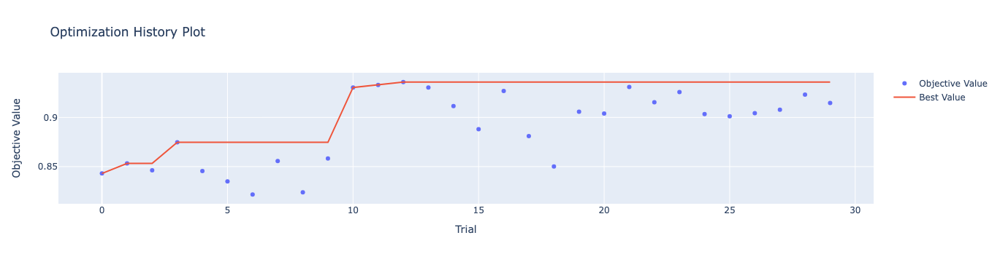

In [54]:
optuna.visualization.plot_optimization_history(study)

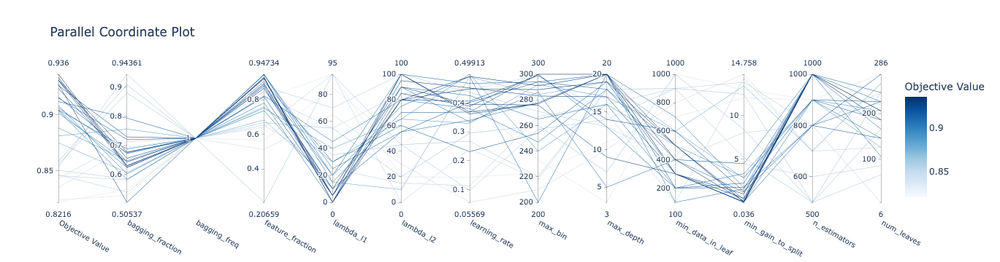

In [55]:
optuna.visualization.plot_parallel_coordinate(study)

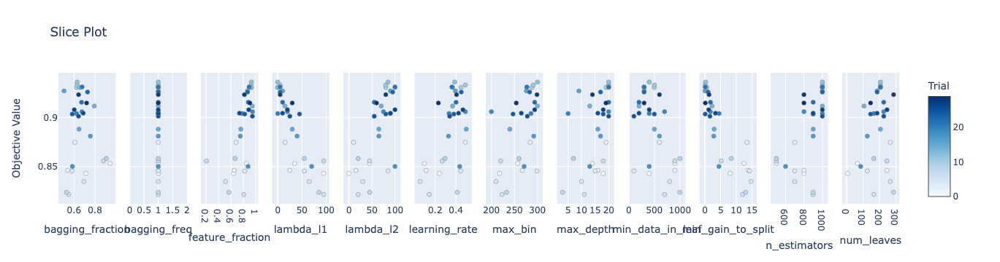

In [56]:
optuna.visualization.plot_slice(study)

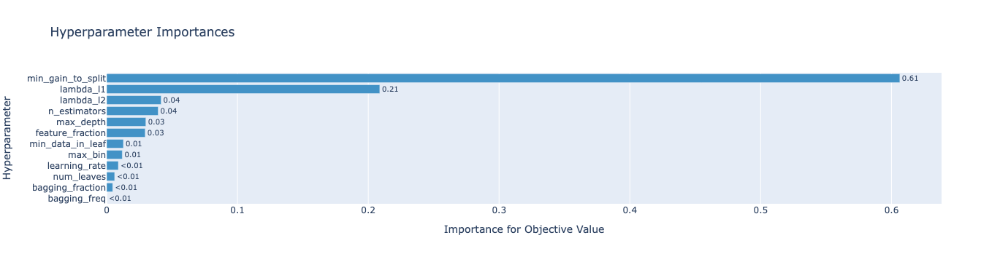

In [57]:
optuna.visualization.plot_param_importances(study)

#### 2.3.3.1.1. BEST LGBM Model and Metrics

In [58]:
Best_trial = study.best_trial.params
Best_trial

{'n_estimators': 1000,
 'learning_rate': 0.38806982477897267,
 'num_leaves': 206,
 'max_depth': 20,
 'min_data_in_leaf': 400,
 'min_gain_to_split': 0.17806370988569686,
 'bagging_fraction': 0.6305821942821531,
 'max_bin': 300,
 'lambda_l1': 0,
 'lambda_l2': 85,
 'bagging_freq': 1,
 'feature_fraction': 0.9296520328839707}

In [59]:
lgbm_model= LGBMClassifier(**Best_trial)
lgbm_model.fit(X_train ,y_train)
y_pred = lgbm_model.predict(X_test)

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] feature_fraction is set=0.9296520328839707, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9296520328839707
[LightGBM] [Warning] bagging_fraction is set=0.6305821942821531, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6305821942821531
[LightGBM] [Warning] min_gain_to_split is set=0.17806370988569686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17806370988569686
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0


In [60]:
## SAVE MODEL

import joblib,pickle
from pickle import dump, load
joblib.dump(lgbm_model, 'lgbm_model.joblib') 


['lgbm_model.joblib']

In [61]:
#load model
joblib.load('/Users/goncaavcicakmak/Desktop/ads-542-finalproject/notebooks/lgbm_model.joblib')


LGBMClassifier(bagging_fraction=0.6305821942821531, bagging_freq=1,
               feature_fraction=0.9296520328839707, lambda_l1=0, lambda_l2=85,
               learning_rate=0.38806982477897267, max_bin=300, max_depth=20,
               min_data_in_leaf=400, min_gain_to_split=0.17806370988569686,
               n_estimators=1000, num_leaves=206)

### 2.3.3.1.2. Classification Report 

In [63]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.95      0.93      1762
           1       0.95      0.92      0.94      1893

    accuracy                           0.94      3655
   macro avg       0.94      0.94      0.94      3655
weighted avg       0.94      0.94      0.94      3655



#### 2.3.3.1.3. SHAPLEY FOR FEATURE IMPORTANCES 

In [64]:
import shap
from shap.maskers import Independent
from shap import TreeExplainer, Explanation, LinearExplainer
from shap.plots import waterfall
lgbm_explainer = shap.TreeExplainer(lgbm_model, X_train, feature_names=X_train.columns.tolist())

In [65]:
lgbm_explainer_values = lgbm_explainer(X_train, y_train,check_additivity=False )

100%|===================| 69426/69441 [55:32<00:00]        

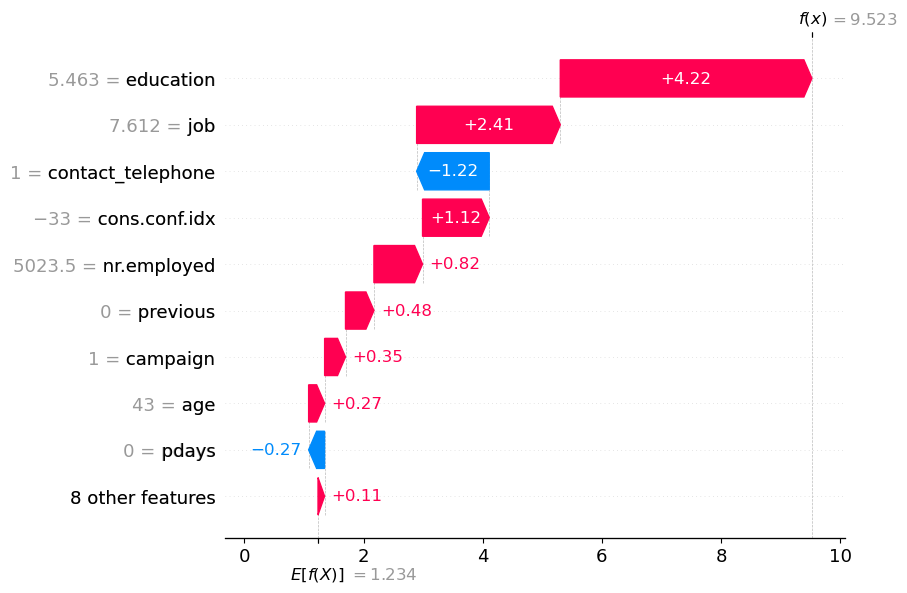

In [66]:
shap.waterfall_plot(lgbm_explainer_values[0])

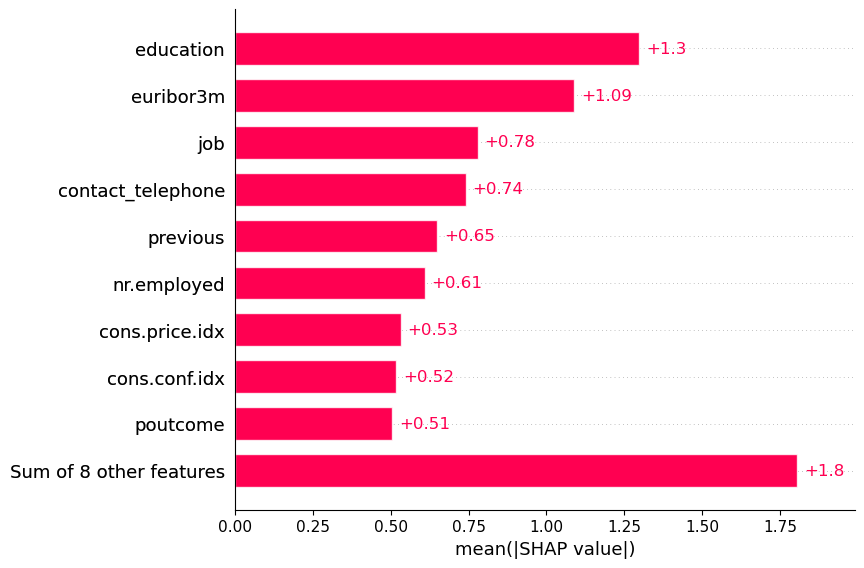

In [67]:
shap.plots.bar(lgbm_explainer_values)

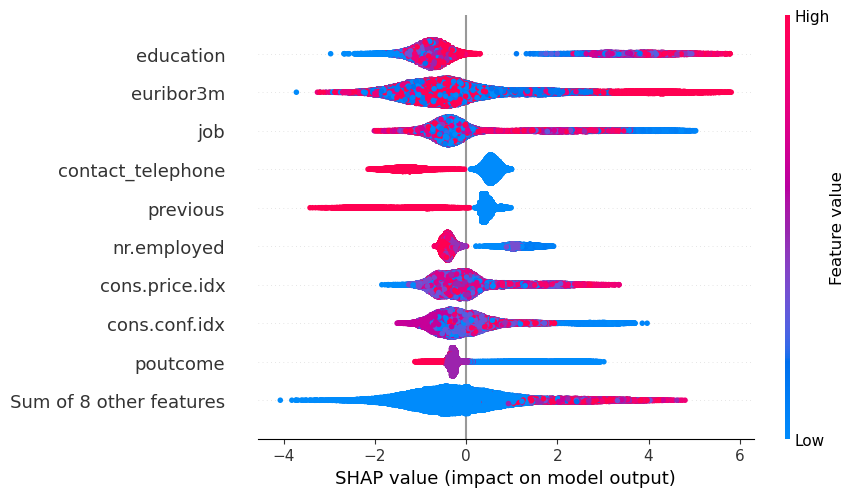

In [68]:
shap.plots.beeswarm(lgbm_explainer_values)

#### 2.3.3.1.4.ROC CURVE

#### Optimal Threshold : ROC curve

The false-positive rate is plotted on the x-axis and the true positive rate is plotted on the y-axis and the plot is referred to as the Receiver Operating Characteristic curve, or ROC curve.
A diagonal line on the plot from the bottom-left to top-right indicates the curve for a no-skill classifier (predicts the majority class in all cases), and a point in the top left of the plot indicates a model with perfect skill.

There are many ways we could locate the threshold with the optimal balance between false positive and true positive rates. Firstly, the true positive rate is called the Sensitivity. One minus the false-positive rate is called the Specificity. The Geometric Mean or G-mean is a metric for imbalanced classification that, if optimized, will seek a balance between the sensitivity and the specificity.




In [81]:
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred)

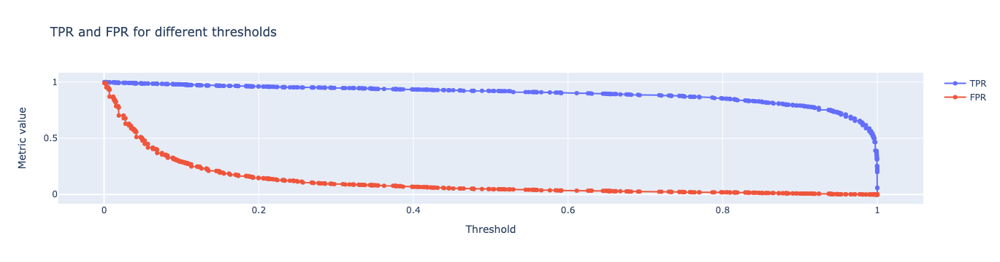

In [76]:
import plotly.express as px
import plotly.graph_objects as go
import scikitplot as skplt

y_proba = lgbm_model.predict_proba(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_proba[:, 1])
thresholds = thresholds[thresholds < 1]

fig = go.Figure()
fig.add_trace(go.Scatter(x=thresholds, y=tpr,
                    mode='lines+markers',
                    name='TPR'))
fig.add_trace(go.Scatter(x=thresholds, y=fpr,
                    mode='lines+markers',
                    name='FPR'))

fig.update_layout(
    title="TPR and FPR for different thresholds",
    xaxis_title="Threshold",
    yaxis_title="Metric value",    
)
fig.show()



#### Optimal Threshold : Precision Recall curve

Unlike the ROC Curve, a precision-recall curve focuses on the performance of a classifier on the positive (minority class) only. Precision is the ratio of the number of true positives divided by the sum of the true positives and false positives.

It describes how good a model is at predicting the positive class. Recall is calculated as the ratio of the number of true positives divided by the sum of the true positives and the false negatives.

In [78]:

precision, recall, thresholds = precision_recall_curve(y_test,y_pred)

#Calculate f-Score
fscore = (2 * precision * recall) / (precision + recall)

# locate the index of the largest g-mean
ix = np.argmax(fscore)

print('Best Threshold=%f, G-mean=%.3f' % (thresholds[ix], fscore[ix]))

Best Threshold=1.000000, G-mean=0.937


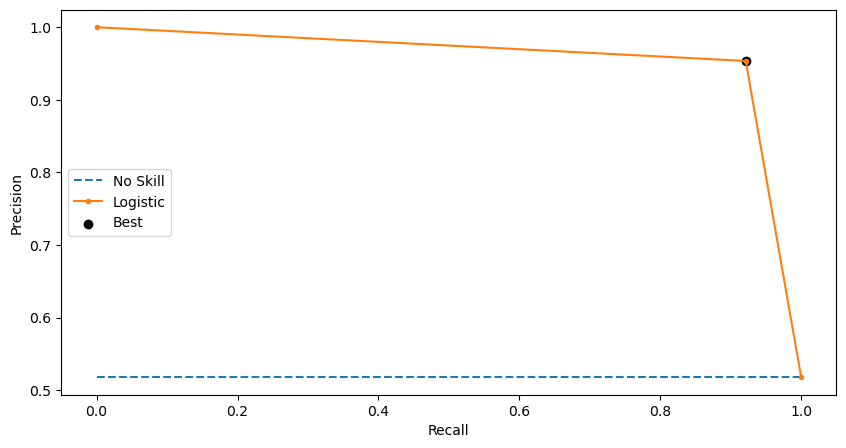

In [79]:
no_skill = len(y_test[y_test==1]) / len(y_test)

plt.figure(figsize=(10,5))
plt.plot([0,1], [no_skill,no_skill], linestyle='--', label='No Skill') 
plt.plot(recall, precision, marker='.', label='Logistic') 
plt.scatter(recall[ix], precision[ix], marker='o', color='black', label='Best') 
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
# show the plot
plt.show()


#### 2.3.3.1.5. CONFUSION MATRIX

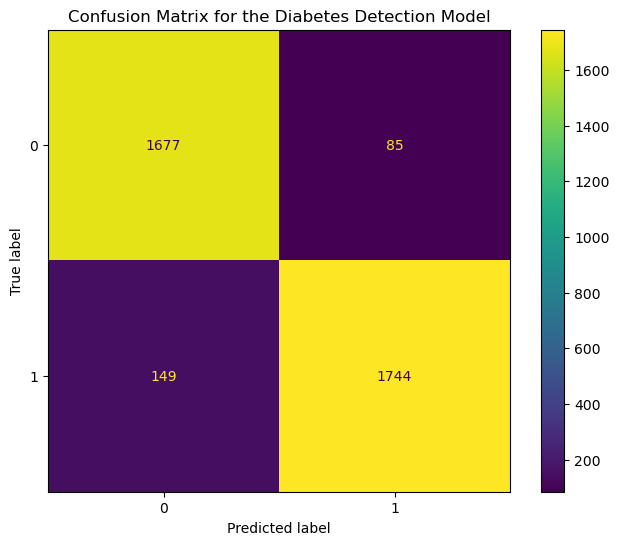

In [82]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
cf =confusion_matrix(y_test,y_pred)
# Change figure size and increase dpi for better resolution
# and get reference to axes object
fig, ax = plt.subplots(figsize=(8,6), dpi=100)

# initialize using the raw 2D confusion matrix 
# and output labels (in our case, it's 0 and 1)
display = ConfusionMatrixDisplay(cf, display_labels=lgbm_model.classes_)

# set the plot title using the axes object
ax.set(title='Confusion Matrix for the Diabetes Detection Model')

# show the plot. 
# Pass the parameter ax to show customizations (ex. title) 
display.plot(ax=ax);

### 2.3.3.2. MODEL-2 BAGGING CLASSIFIER

In [83]:
import warnings
warnings.filterwarnings("ignore")

In [84]:
def objective(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
   
        'bootstrap': trial.suggest_categorical("bootstrap", [True, False]),
        'bootstrap_features': trial.suggest_categorical("bootstrap_features", [True, False]),
        "n_jobs":-1, # deploy 100% of gpu's computational power 
        "random_state":42}
    
    model =BaggingClassifier(**param)  
    
    model.fit(X_train,y_train)
    
    y_pred = model.predict(X_test)

    # Evaluate predictions
    f1_scores=f1_score(y_test, y_pred, average='weighted')
    return f1_scores

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30)

[I 2023-05-30 15:59:02,846] A new study created in memory with name: no-name-2b086bc0-be9f-48b7-ad1d-56f68afb2c15
[I 2023-05-30 15:59:37,539] Trial 0 finished with value: 0.9357128972320121 and parameters: {'n_estimators': 892, 'bootstrap': True, 'bootstrap_features': False}. Best is trial 0 with value: 0.9357128972320121.
[I 2023-05-30 16:00:21,639] Trial 1 finished with value: 0.8932129906221307 and parameters: {'n_estimators': 801, 'bootstrap': False, 'bootstrap_features': False}. Best is trial 0 with value: 0.9357128972320121.
[I 2023-05-30 16:01:00,160] Trial 2 finished with value: 0.8934887387955087 and parameters: {'n_estimators': 628, 'bootstrap': False, 'bootstrap_features': False}. Best is trial 0 with value: 0.9357128972320121.
[I 2023-05-30 16:01:20,819] Trial 3 finished with value: 0.9395495318608043 and parameters: {'n_estimators': 596, 'bootstrap': True, 'bootstrap_features': True}. Best is trial 3 with value: 0.9395495318608043.
[I 2023-05-30 16:01:41,174] Trial 4 finis

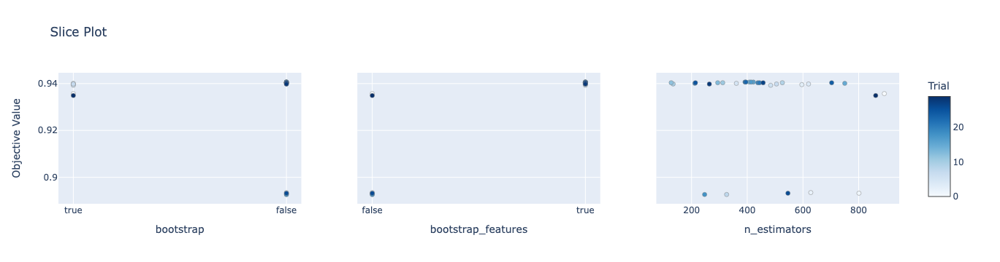

In [93]:
optuna.visualization.plot_slice(study)

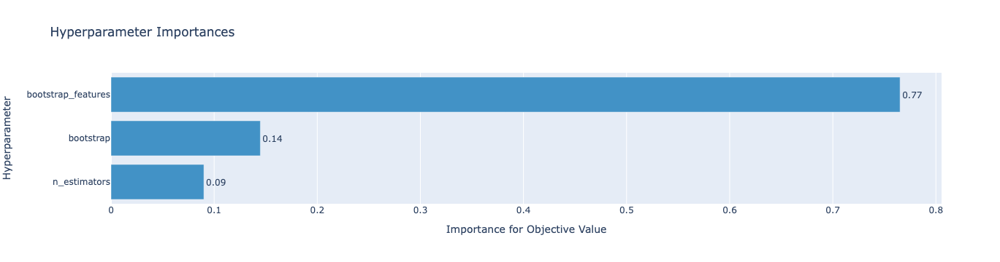

In [94]:
optuna.visualization.plot_param_importances(study)

### 2.3.3.2.1. Best Model

In [95]:
Best_trial = study.best_trial.params
Best_trial

{'n_estimators': 408, 'bootstrap': False, 'bootstrap_features': True}

In [12]:
best_trial={'n_estimators': 408, 'bootstrap': False, 'bootstrap_features': True}
baggin_classifier_model=  BaggingClassifier(**best_trial)
baggin_classifier_model.fit(X_train ,y_train)
y_pred = baggin_classifier_model.predict(X_test)

In [13]:
# SAVE MODEL
import joblib
joblib.dump(baggin_classifier_model, 'bagging_classifier_model.joblib') 

['bagging_classifier_model.joblib']

In [14]:
#load model
model = joblib.load('/Users/goncaavcicakmak/Desktop/ads-542-finalproject/notebooks/bagging_classifier_model.joblib')

### 2.3.3.2.2. Classification report 

In [13]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.95      0.94      1762
           1       0.95      0.94      0.95      1893

    accuracy                           0.94      3655
   macro avg       0.94      0.94      0.94      3655
weighted avg       0.94      0.94      0.94      3655



### 2.3.3.2.3. ROC Curve

In [14]:
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Average precision recall score for classifier 92.7


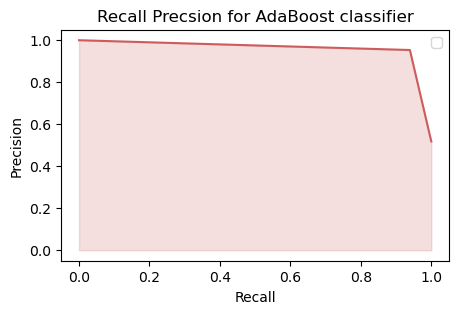

In [15]:
fig, ax = plt.subplots(figsize = (5,3))
color = 'indianred'

y_pred_decision = baggin_classifier_model.predict(X_test)
AP_score = average_precision_score(y_test, y_pred_decision)
print('Average precision recall score for classifier %.1f' %(AP_score * 100))
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_decision)
#precision, recall, _ = precision_recall_curve(original_ytest, original_y_pred_decision)
sns.lineplot(x=recall, y=precision, ax = ax, color = color)
ax.fill_between(recall, precision, 0, alpha = 0.2, color = color)

ax.set_xlabel('Recall')
ax.set_ylabel('Precision')
ax.set_title('Recall Precsion for AdaBoost classifier')
ax.legend()
plt.show()

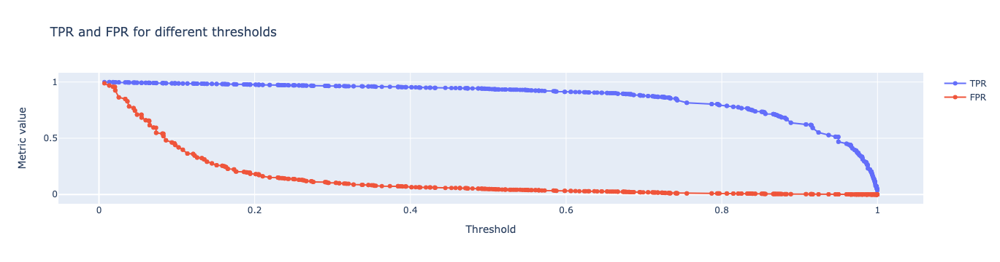

In [16]:
import plotly.graph_objs as go
y_proba = baggin_classifier_model.predict_proba(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_proba[:, 1])
thresholds = thresholds[thresholds < 1]

fig = go.Figure()
fig.add_trace(go.Scatter(x=thresholds, y=tpr,
                    mode='lines+markers',
                    name='TPR'))
fig.add_trace(go.Scatter(x=thresholds, y=fpr,
                    mode='lines+markers',
                    name='FPR'))

fig.update_layout(
    title="TPR and FPR for different thresholds",
    xaxis_title="Threshold",
    yaxis_title="Metric value",    
)
fig.show()

In [17]:

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
gmeans = np.sqrt(tpr * (1-fpr))

# locate the index of the largest g-mean
ix = np.argmax(gmeans)

print('Best Threshold=%f, G-mean=%.3f' % (thresholds[ix], gmeans[ix]))

Best Threshold=1.000000, G-mean=0.945


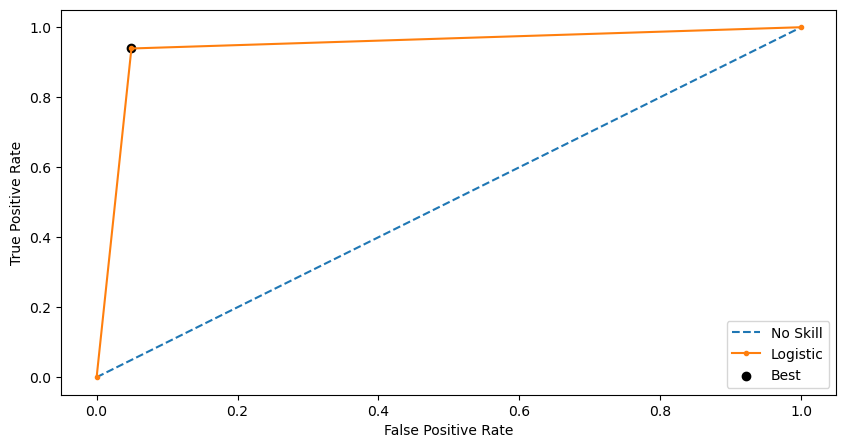

In [18]:
plt.figure(figsize=(10,5))
plt.plot([0,1], [0,1], linestyle='--', label='No Skill') 

plt.plot(fpr, tpr, marker='.', label='Logistic') 
plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best') 
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.show()

In [19]:

precision, recall, thresholds = precision_recall_curve(y_test,y_pred)

#Calculate f-Score
fscore = (2 * precision * recall) / (precision + recall)

# locate the index of the largest g-mean
ix = np.argmax(fscore)

print('Best Threshold=%f, G-mean=%.3f' % (thresholds[ix], fscore[ix]))

Best Threshold=1.000000, G-mean=0.946


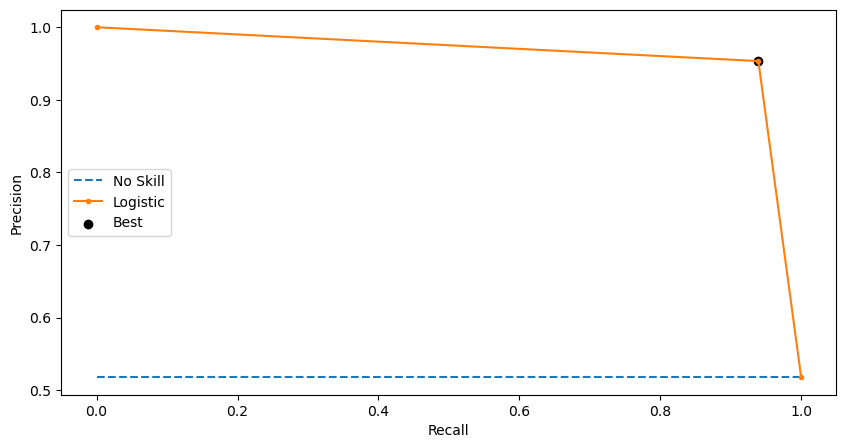

In [20]:
no_skill = len(y_test[y_test==1]) / len(y_test)

plt.figure(figsize=(10,5))
plt.plot([0,1], [no_skill,no_skill], linestyle='--', label='No Skill') 
plt.plot(recall, precision, marker='.', label='Logistic') 
plt.scatter(recall[ix], precision[ix], marker='o', color='black', label='Best') 
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
# show the plot
plt.show()

#### 2.3.3.2.4. CONFUSION MATRIX

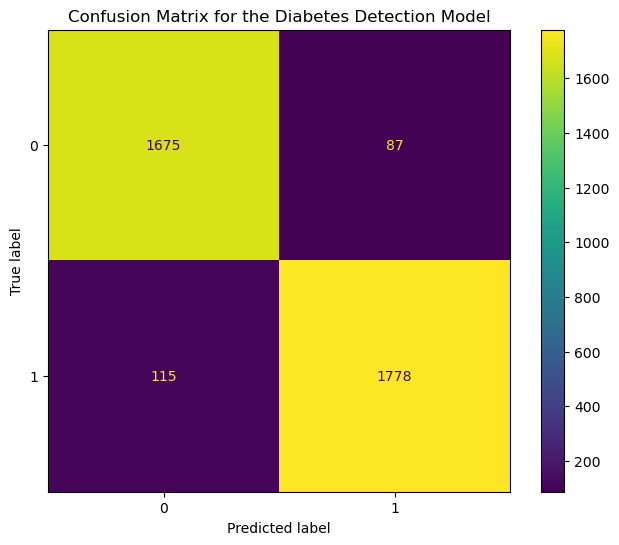

In [22]:
#create confusion matrix
c_matrix = metrics.confusion_matrix(y_test, y_pred)
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
cf =confusion_matrix(y_test,y_pred)
# Change figure size and increase dpi for better resolution
# and get reference to axes object
fig, ax = plt.subplots(figsize=(8,6), dpi=100)

# initialize using the raw 2D confusion matrix 
# and output labels (in our case, it's 0 and 1)
display = ConfusionMatrixDisplay(cf, display_labels=baggin_classifier_model.classes_)

# set the plot title using the axes object
ax.set(title='Confusion Matrix for the Diabetes Detection Model')

# show the plot. 
# Pass the parameter ax to show customizations (ex. title) 
display.plot(ax=ax);

#### 2.3.3.3. MODEL-3 XGBOOST CLASSIFIER

In [112]:
def objective(trial):

    param = {
        
        # hyperparameter settings
        
        'max_depth': trial.suggest_int('max_depth', 1, 17),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.15),
        'n_estimators': trial.suggest_int('n_estimators', 50, 1500),
        'subsample': trial.suggest_float('subsample', 0.01, 0.65),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 0.95),
        "reg_alpha":trial.suggest_float("reg_alpha",0.1,0.5),
        "reg_lambda":trial.suggest_float("reg_lambda",0.1,0.5),
        
        # non-hyperparameter settings
        
        "n_jobs":-1, # deploy 100% of gpu's computational power 
        "random_state":42
    }
    
    model =XGBClassifier(**param,objective ='reg:squarederror')  
    
    model.fit(X_train,y_train,eval_set=[(X_test,y_test)],early_stopping_rounds=100,verbose=False)
    
    y_pred = model.predict(X_test)

    # Evaluate predictions
    f1_scores=f1_score(y_test, y_pred, average='weighted')
    return f1_scores

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30)


[I 2023-05-30 16:21:26,795] A new study created in memory with name: no-name-a1441cd1-cade-4ebe-b3ce-cd1d4d028c3f
[I 2023-05-30 16:21:27,886] Trial 0 finished with value: 0.8316364422001341 and parameters: {'max_depth': 3, 'learning_rate': 0.06563295922676611, 'n_estimators': 113, 'subsample': 0.2591089239598389, 'colsample_bytree': 0.5184819823695472, 'reg_alpha': 0.1805086900205357, 'reg_lambda': 0.2442165509884085}. Best is trial 0 with value: 0.8316364422001341.
[I 2023-05-30 16:21:40,250] Trial 1 finished with value: 0.8985171265859213 and parameters: {'max_depth': 7, 'learning_rate': 0.058285298730365684, 'n_estimators': 1334, 'subsample': 0.4493127562976934, 'colsample_bytree': 0.0726305040436123, 'reg_alpha': 0.3438065158958268, 'reg_lambda': 0.30843408275996387}. Best is trial 1 with value: 0.8985171265859213.
[I 2023-05-30 16:21:52,875] Trial 2 finished with value: 0.9332633677479425 and parameters: {'max_depth': 11, 'learning_rate': 0.08182861011887228, 'n_estimators': 562, 

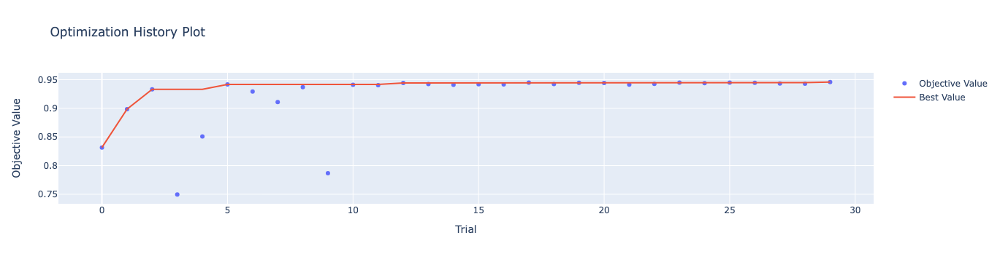

In [113]:
optuna.visualization.plot_optimization_history(study)

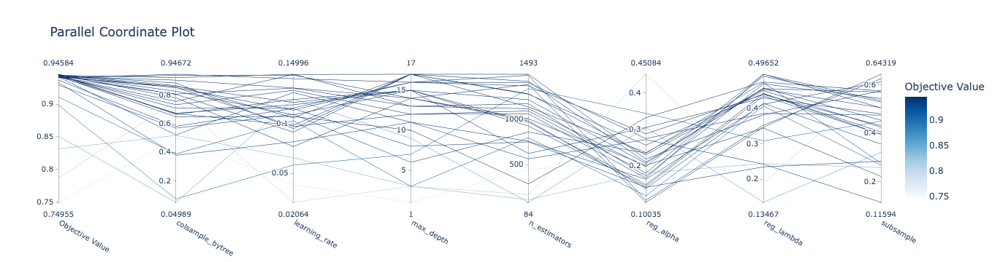

In [114]:
optuna.visualization.plot_parallel_coordinate(study)

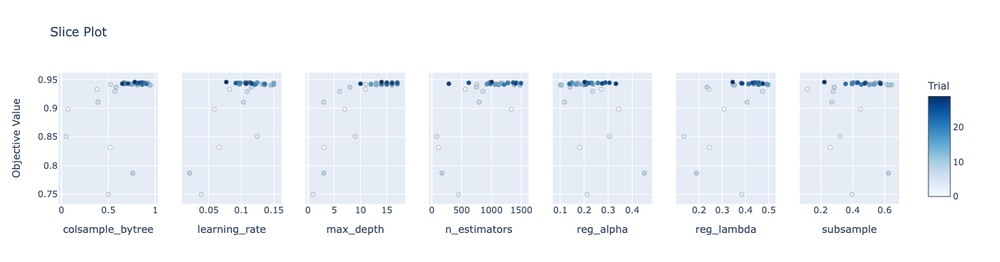

In [115]:
optuna.visualization.plot_slice(study)

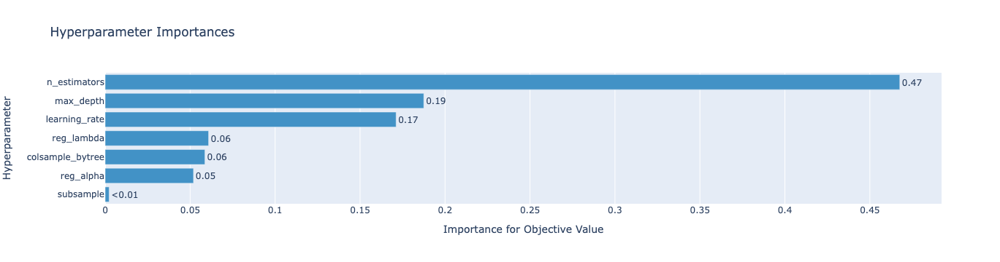

In [116]:
optuna.visualization.plot_param_importances(study)

#### 2.3.3.3.1 BEST XGB MODEL AND EVALUATION METRICS

In [117]:
Best_trial = study.best_trial.params
Best_trial

{'max_depth': 14,
 'learning_rate': 0.07697228002094164,
 'n_estimators': 1003,
 'subsample': 0.22261932136697424,
 'colsample_bytree': 0.7813850759192211,
 'reg_alpha': 0.20182846709940708,
 'reg_lambda': 0.34473600882692257}

In [14]:
best_trial={'max_depth': 14,
 'learning_rate': 0.07697228002094164,
 'n_estimators': 1003,
 'subsample': 0.22261932136697424,
 'colsample_bytree': 0.7813850759192211,
 'reg_alpha': 0.20182846709940708,
 'reg_lambda': 0.34473600882692257}
xgb_model= XGBClassifier(**best_trial)
xgb_model.fit(X_train ,y_train)
y_pred = xgb_model.predict(X_test)

In [16]:
# SAVE MODEL
import joblib
joblib.dump(xgb_model, 'xgb_model.joblib') 

['xgb_model.joblib']

In [17]:
#load model
model1 = joblib.load('/Users/goncaavcicakmak/Desktop/ads-542-finalproject/notebooks/xgb_model.joblib')

In [121]:
model1.predict(X_test)

array([1, 1, 1, ..., 0, 1, 1])

### 2.3.3.3.2 FEATURE IMPORTANCE 

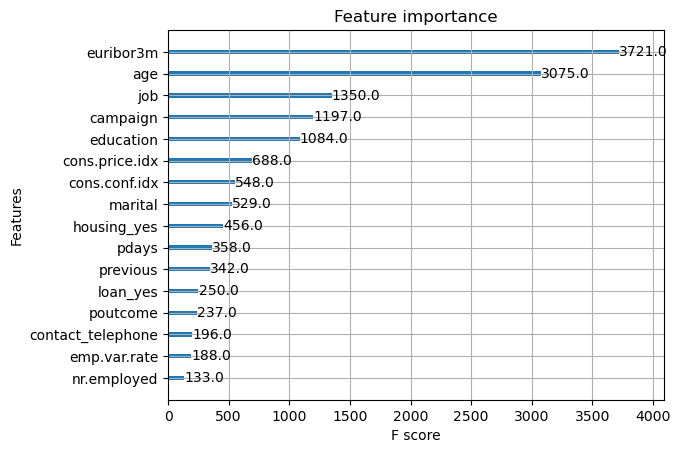

In [21]:
from xgboost import XGBClassifier
from matplotlib import pyplot
from xgboost import plot_importance
plot_importance(xgb_model)
pyplot.show()

### 2.3.3.3.3. Classification Report 

In [18]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.94      0.94      1762
           1       0.95      0.94      0.94      1893

    accuracy                           0.94      3655
   macro avg       0.94      0.94      0.94      3655
weighted avg       0.94      0.94      0.94      3655



In [22]:
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred)

#### 2.3.3.3.4. ROC SURVE 

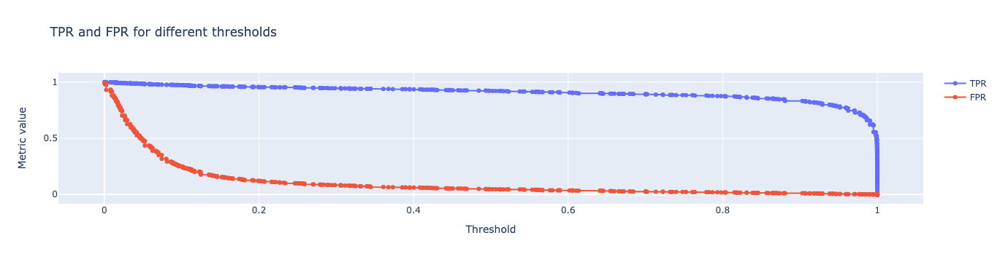

In [25]:
import plotly.express as px
import plotly.graph_objects as go
import scikitplot as skplt
y_proba = xgb_model.predict_proba(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_proba[:, 1])
thresholds = thresholds[thresholds <= 1]

fig = go.Figure()
fig.add_trace(go.Scatter(x=thresholds, y=tpr,
                    mode='lines+markers',
                    name='TPR'))
fig.add_trace(go.Scatter(x=thresholds, y=fpr,
                    mode='lines+markers',
                    name='FPR'))

fig.update_layout(
    title="TPR and FPR for different thresholds",
    xaxis_title="Threshold",
    yaxis_title="Metric value",    
)
fig.show()

In [27]:
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred)

In [28]:

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
gmeans = np.sqrt(tpr * (1-fpr))

# locate the index of the largest g-mean
ix = np.argmax(gmeans)

print('Best Threshold=%f, G-mean=%.3f' % (thresholds[ix], gmeans[ix]))

Best Threshold=1.000000, G-mean=0.937


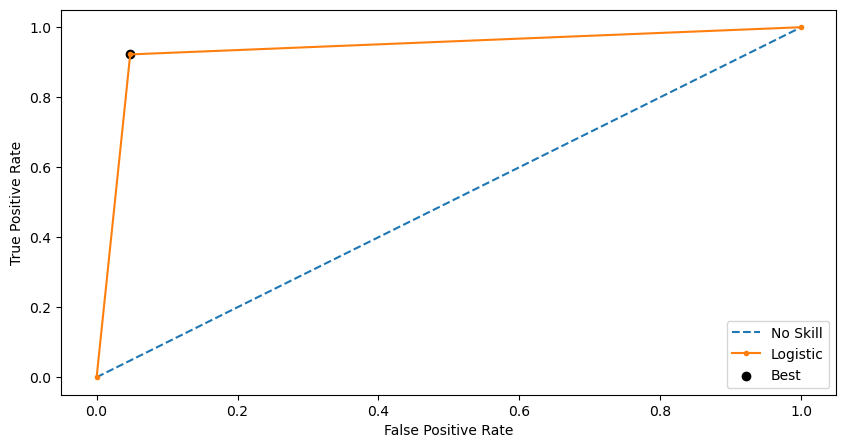

In [29]:
plt.figure(figsize=(10,5))
plt.plot([0,1], [0,1], linestyle='--', label='No Skill') 

plt.plot(fpr, tpr, marker='.', label='Logistic') 
plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best') 
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.show()

In [30]:


precision, recall, thresholds = precision_recall_curve(y_test,y_pred)

#Calculate f-Score
fscore = (2 * precision * recall) / (precision + recall)

# locate the index of the largest g-mean
ix = np.argmax(fscore)

print('Best Threshold=%f, G-mean=%.3f' % (thresholds[ix], fscore[ix]))

Best Threshold=1.000000, G-mean=0.938


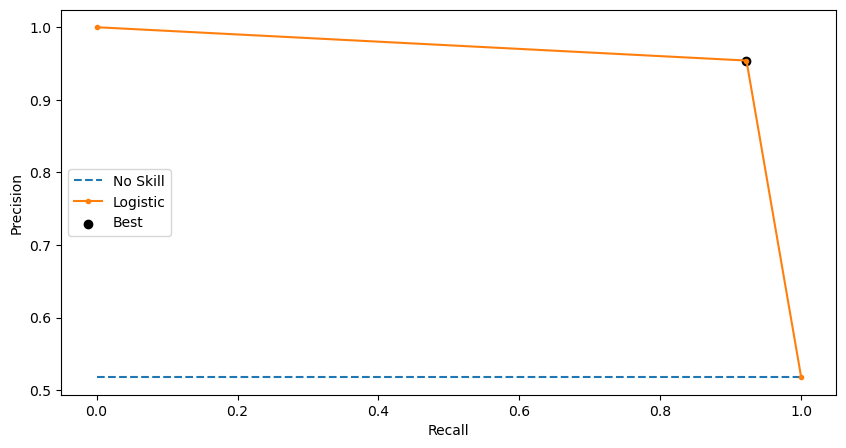

In [31]:
no_skill = len(y_test[y_test==1]) / len(y_test)

plt.figure(figsize=(10,5))
plt.plot([0,1], [no_skill,no_skill], linestyle='--', label='No Skill') 
plt.plot(recall, precision, marker='.', label='Logistic') 
plt.scatter(recall[ix], precision[ix], marker='o', color='black', label='Best') 
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
# show the plot
plt.show()

#### 2.3.3.3.5. CONFUSION MATRIX

In [32]:
cf =confusion_matrix(y_test,y_pred)

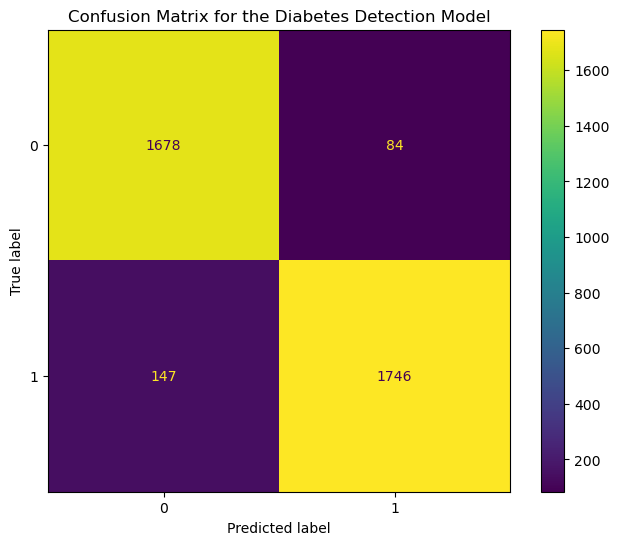

In [33]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
cf =confusion_matrix(y_test,y_pred)
# Change figure size and increase dpi for better resolution
# and get reference to axes object
fig, ax = plt.subplots(figsize=(8,6), dpi=100)

# initialize using the raw 2D confusion matrix 
# and output labels (in our case, it's 0 and 1)
display = ConfusionMatrixDisplay(cf, display_labels=xgb_model.classes_)

# set the plot title using the axes object
ax.set(title='Confusion Matrix for the Diabetes Detection Model')

# show the plot. 
# Pass the parameter ax to show customizations (ex. title) 
display.plot(ax=ax);

### 2.4. ENSEMBLE MODELS WITH VOTING CLASSIFIER

Ensemble models combine the decisions from multiple models to improve the overall performance. This can be achieved in various ways. 

#### 2.4.1. VOTING CLASSIFIER

Voting is one of the ensemble machine learning algorithm.A voting ensemble involves summing the predictions made by classification models or averaging the predictions made by regression models.

For regression, a voting ensemble involves making a prediction that is the average of multiple other regression models.

In classification, a hard voting ensemble involves summing the votes for crisp class labels from other models and predicting the class with the most votes. A soft voting ensemble involves summing the predicted probabilities for class labels and predicting the class label with the largest sum probability.

In [80]:
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold
from sklearn.ensemble import VotingClassifier

votes = [('lgbm',lgbm_model ),
         ('xgb',xgb_model),
         ('bagging_classifier',baggin_classifier_model )]

# soft voting based on weights
votesClass = VotingClassifier(estimators=votes, voting='soft', n_jobs=-1)
votesClass_cv = cross_validate(votesClass, X_train, y_train, cv=KFold(3))
votesClass.fit(X_train, y_train)
y_pred = votesClass.predict(X_test) 
print("Score:",votesClass.score(X_test,y_test))


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] feature_fraction is set=0.27376647954063726, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.27376647954063726
[LightGBM] [Warning] bagging_fraction is set=0.6120615784321417, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6120615784321417
[LightGBM] [Warning] min_gain_to_split is set=0.13495390915057787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13495390915057787
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
Score: 0.9455540355677154


### 2.4.1.1 ROC Curve 

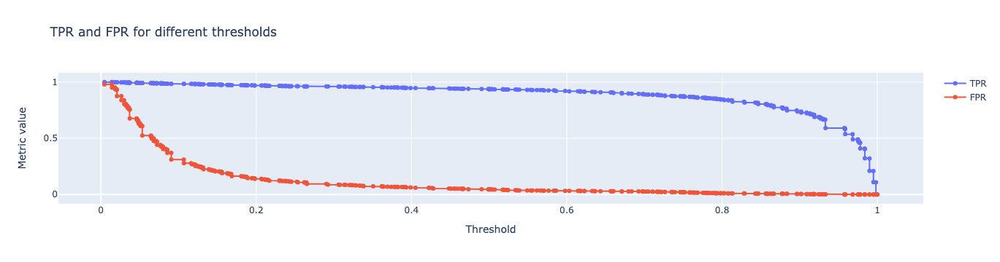

In [81]:
y_proba = votesClass.predict_proba(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_proba[:, 1])
thresholds = thresholds[thresholds <= 1]

fig = go.Figure()
fig.add_trace(go.Scatter(x=thresholds, y=tpr,
                    mode='lines+markers',
                    name='TPR'))
fig.add_trace(go.Scatter(x=thresholds, y=fpr,
                    mode='lines+markers',
                    name='FPR'))

fig.update_layout(
    title="TPR and FPR for different thresholds",
    xaxis_title="Threshold",
    yaxis_title="Metric value",    
)
fig.show()

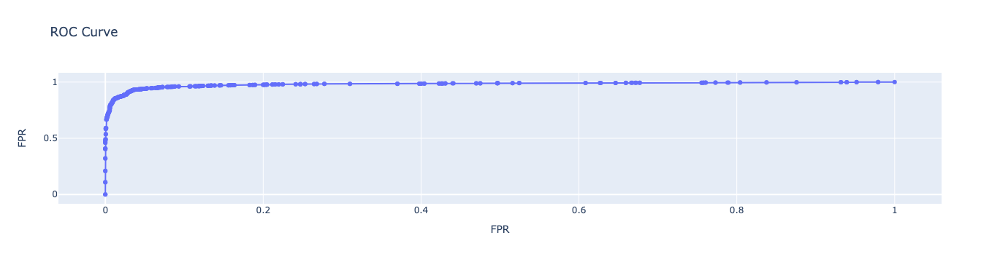

In [82]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=fpr, y=tpr,
                    mode='lines+markers',
                    name='TPR'))
fig.update_layout(
    title="ROC Curve",
    xaxis_title="FPR",
    yaxis_title="FPR",    
)
fig.show()

### 2.4.1.2 Confusion Matrix

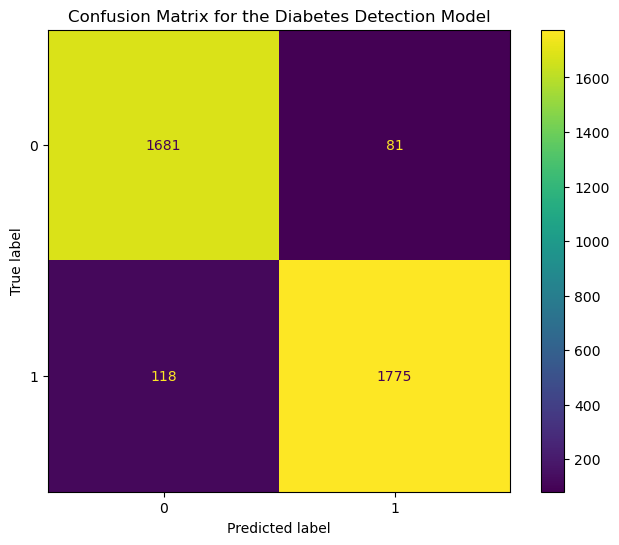

In [83]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
cf =confusion_matrix(y_test,y_pred)
# Change figure size and increase dpi for better resolution
# and get reference to axes object
fig, ax = plt.subplots(figsize=(8,6), dpi=100)

# initialize using the raw 2D confusion matrix 
# and output labels (in our case, it's 0 and 1)
display = ConfusionMatrixDisplay(cf, display_labels=votesClass.classes_)

# set the plot title using the axes object
ax.set(title='Confusion Matrix for the Diabetes Detection Model')

# show the plot. 
# Pass the parameter ax to show customizations (ex. title) 
display.plot(ax=ax);

In [84]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94      1762
           1       0.96      0.94      0.95      1893

    accuracy                           0.95      3655
   macro avg       0.95      0.95      0.95      3655
weighted avg       0.95      0.95      0.95      3655



In [85]:
# SAVE MODEL
joblib.dump(votesClass, 'votesClass_model.joblib') 

['votesClass_model.joblib']

In [87]:

model = joblib.load('/Users/goncaavcicakmak/Desktop/ads-542-finalproject/notebooks/votesClass_model.joblib')

### 2.4.2. STACKING 

Stacking is an ensemble learning technique that uses predictions from multiple models (for example decision tree, knn or svm) to build a new model. This model is used for making predictions on the test set.

The final_estimator will use the predictions of the estimators as input. It needs to be a classifier or a regressor when using StackingClassifier or StackingRegressor.

In [88]:
from sklearn.ensemble import StackingClassifier

level0 = list()
level0.append(('lgbm', lgbm_model))
level0.append(('xgb', xgb_model ))
level0.append(('bagging_classifier', baggin_classifier_model ))
# define meta learner model
level1 = LogisticRegression()
# define the stacking ensemble
stack_model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)

stack_model.fit(X_train,y_train)
y_pred = stack_model.predict(X_test)
print("Score:",stack_model.score(X_test,y_test))

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] feature_fraction is set=0.27376647954063726, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.27376647954063726
[LightGBM] [Warning] bagging_fraction is set=0.6120615784321417, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6120615784321417
[LightGBM] [Warning] min_gain_to_split is set=0.13495390915057787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13495390915057787
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


### 2.4.2.1 ROC Curve

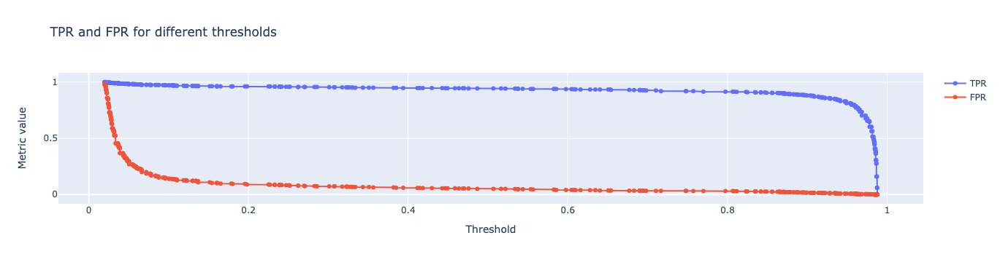

In [89]:
y_proba = stack_model.predict_proba(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_proba[:, 1])
thresholds = thresholds[thresholds <= 1]

fig = go.Figure()
fig.add_trace(go.Scatter(x=thresholds, y=tpr,
                    mode='lines+markers',
                    name='TPR'))
fig.add_trace(go.Scatter(x=thresholds, y=fpr,
                    mode='lines+markers',
                    name='FPR'))

fig.update_layout(
    title="TPR and FPR for different thresholds",
    xaxis_title="Threshold",
    yaxis_title="Metric value",    
)
fig.show()

### 2.4.2.2. Confusion Matrix

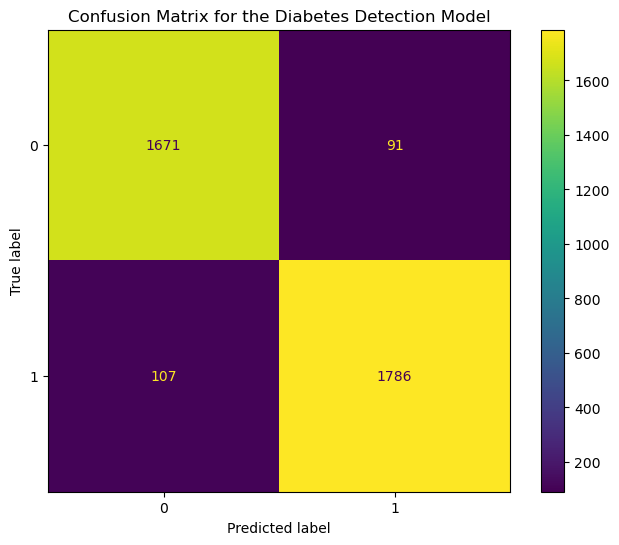

In [91]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
cf =confusion_matrix(y_test,y_pred)
# Change figure size and increase dpi for better resolution
# and get reference to axes object
fig, ax = plt.subplots(figsize=(8,6), dpi=100)

# initialize using the raw 2D confusion matrix 
# and output labels (in our case, it's 0 and 1)
display = ConfusionMatrixDisplay(cf, display_labels=stack_model.classes_)

# set the plot title using the axes object
ax.set(title='Confusion Matrix for the Diabetes Detection Model')

# show the plot. 
# Pass the parameter ax to show customizations (ex. title) 
display.plot(ax=ax);

### 2.4.2.3 Classification Report 

In [92]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.95      0.94      1762
           1       0.95      0.94      0.95      1893

    accuracy                           0.95      3655
   macro avg       0.95      0.95      0.95      3655
weighted avg       0.95      0.95      0.95      3655



In [95]:
# SAVE MODEL
joblib.dump(stack_model, 'stack_model.joblib') 

['stack_model.joblib']

In [97]:

model = joblib.load('/Users/goncaavcicakmak/Desktop/ads-542-finalproject/notebooks/stack_model.joblib')

### 2.4.3. BAGGING REGRESSOR

A Bagging regressor is an ensemble meta-estimator that fits base regressors each on random subsets of the original dataset and then aggregate their individual predictions (either by voting or by averaging) to form a final prediction. Such a meta-estimator can typically be used as a way to reduce the variance of a black-box estimator (e.g., a decision tree), by introducing randomization into its construction procedure and then making an ensemble out of it.

In [98]:
from sklearn.svm import SVR
from sklearn.ensemble import BaggingClassifier
bagging_reg_model = BaggingClassifier(base_estimator=lgbm_model,n_estimators=500,max_samples=0.25,bootstrap=True,max_features=0.5,bootstrap_features=True,random_state=42)

bagging_reg_model.fit(X_train,y_train)
y_pred = bagging_reg_model.predict(X_test)
print("Score:",bagging_reg_model.score(X_test,y_test))

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_gain_to_split is set=0.13495390915057787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13495390915057787
[LightGBM] [Warning] feature_fraction is set=0.27376647954063726, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.27376647954063726
[LightGBM] [Warning] bagging_fraction is set=0.6120615784321417, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6120615784321417
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
Score: 0.8782489740082079


### 2.4.3.1 ROC Curve

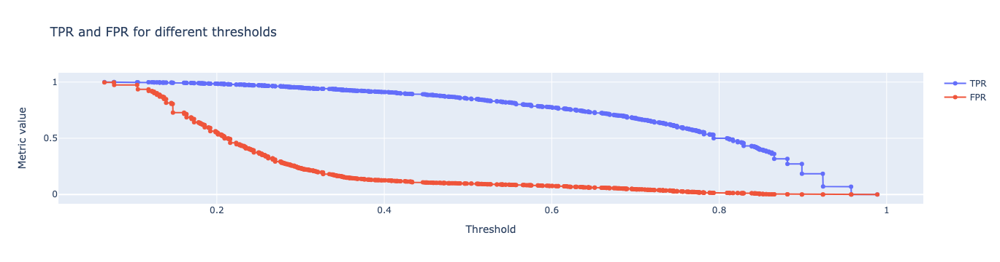

In [99]:
y_proba = bagging_reg_model.predict_proba(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_proba[:, 1])
thresholds = thresholds[thresholds <= 1]

fig = go.Figure()
fig.add_trace(go.Scatter(x=thresholds, y=tpr,
                    mode='lines+markers',
                    name='TPR'))
fig.add_trace(go.Scatter(x=thresholds, y=fpr,
                    mode='lines+markers',
                    name='FPR'))

fig.update_layout(
    title="TPR and FPR for different thresholds",
    xaxis_title="Threshold",
    yaxis_title="Metric value",    
)
fig.show()

### 2.4.3.2 Classification Report

In [100]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.90      0.88      1762
           1       0.90      0.86      0.88      1893

    accuracy                           0.88      3655
   macro avg       0.88      0.88      0.88      3655
weighted avg       0.88      0.88      0.88      3655



### 2.4.3.3. Classification Report 

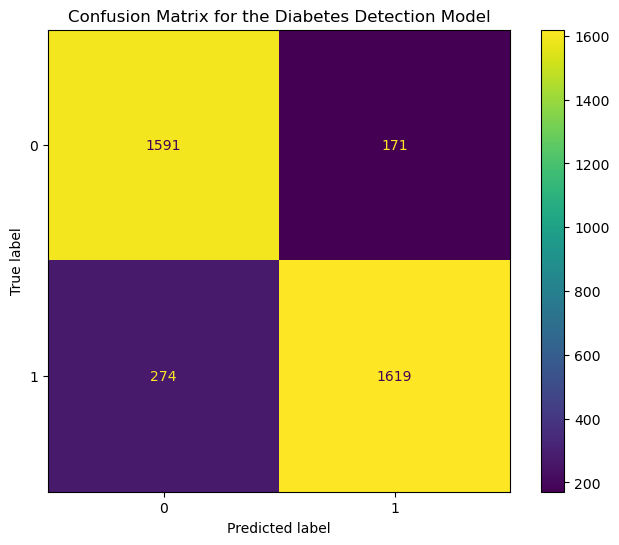

In [101]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
cf =confusion_matrix(y_test,y_pred)
# Change figure size and increase dpi for better resolution
# and get reference to axes object
fig, ax = plt.subplots(figsize=(8,6), dpi=100)

# initialize using the raw 2D confusion matrix 
# and output labels (in our case, it's 0 and 1)
display = ConfusionMatrixDisplay(cf, display_labels=bagging_reg_model.classes_)

# set the plot title using the axes object
ax.set(title='Confusion Matrix for the Diabetes Detection Model')

# show the plot. 
# Pass the parameter ax to show customizations (ex. title) 
display.plot(ax=ax);

In [102]:
# SAVE MODEL
joblib.dump(bagging_reg_model, 'bagging_reg_model.joblib') 


['bagging_reg_model.joblib']

In [103]:

model = joblib.load('/Users/goncaavcicakmak/Desktop/ads-542-finalproject/notebooks/bagging_reg_model.joblib')

### 2.5. MAKE PIPELINE FOR MODEL DEPLOYEMENT WITH STREAMLIT

In [78]:
df_last=pd.read_csv("/Users/goncaavcicakmak/Desktop/ads-542-finalproject/notebooks/train.csv" , index_col=[0])

In [79]:
df_last.head()

,age,job,marital,education,default,housing,loan,contact,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.y,no,no,no,telephone,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,highschool,NaN,no,no,telephone,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,highschool,no,yes,no,telephone,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin,married,basic6y,no,no,no,telephone,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,highschool,no,no,yes,telephone,1,0,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [80]:
df_last.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39411 entries, 0 to 41187
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             39411 non-null  int64  
 1   job             39102 non-null  object 
 2   marital         39339 non-null  object 
 3   education       37763 non-null  object 
 4   default         31264 non-null  object 
 5   housing         38467 non-null  object 
 6   loan            38467 non-null  object 
 7   contact         39411 non-null  object 
 8   campaign        39411 non-null  int64  
 9   pdays           39411 non-null  int64  
 10  previous        39411 non-null  int64  
 11  poutcome        39411 non-null  object 
 12  emp.var.rate    39411 non-null  float64
 13  cons.price.idx  39411 non-null  float64
 14  cons.conf.idx   39411 non-null  float64
 15  euribor3m       39411 non-null  float64
 16  nr.employed     39411 non-null  float64
 17  y               39411 non-null 

In [81]:
y=df_last['y']

In [82]:
df_last['y'] = df_last['y'].replace( ['yes','no'],[1,0] )

In [83]:
df_last['y'].value_counts()

0    34844
1     4567
Name: y, dtype: int64

In [84]:
import numpy as np
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(missing_values = np.nan,strategy ='most_frequent')

imputer = imputer.fit(df_last)
 
# Imputing the data    
df_last1 = imputer.transform(df_last)
df_last2=pd.DataFrame(data=df_last1,columns=df_last.columns)

In [87]:
y=df_last2['y']

In [88]:
X=df_last2.drop('y',axis=1)

In [89]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [90]:
categorical_features=['marital','poutcome','job','education','default','housing', 'contact','loan']

In [91]:
numeric_features = ['age', 'campaign', 'pdays','previous','emp.var.rate','cons.price.idx','cons.conf.idx','euribor3m','nr.employed']

In [92]:
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier
from sklearn.impute import SimpleImputer
from sklearn.compose import make_column_selector as selector
from sklearn.preprocessing import StandardScaler, OneHotEncoder,OrdinalEncoder
from sklearn.compose import make_column_selector as selector
from sklearn.compose import ColumnTransformer

numeric_transformer = Pipeline(steps=[ ("scaler", StandardScaler())])

categorical_transformer = Pipeline(steps=[("encoder", OneHotEncoder(handle_unknown="ignore"))])
preprocessor = ColumnTransformer(transformers=[("num", numeric_transformer, numeric_features),("cat", categorical_transformer, categorical_features)])

best_params={'max_depth': 12,
             'learning_rate': 0.06021105304799994,
             'n_estimators': 833,
             'subsample': 0.556135644177332,
             'colsample_bytree': 0.7468568632513666,
             'reg_alpha': 0.31878957988713713,
             'reg_lambda': 0.3308651945471638}
clf = Pipeline(
    steps=[("preprocessor", preprocessor), ("classifier", XGBClassifier(**best_params))])


In [93]:
from sklearn import set_config
set_config(display='diagram')
display(clf)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['age', 'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['marital', 'poutcome', 'job',
                                                   'education', 'def...
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.06021105304799994, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max_delta_step=None, max_depth=12,
                               max_leaves=None, min_child_weight=None,
                               missing=nan, monotone_constraints=None,
                               n_estimators=833, n_jobs=None,
                               num_parallel_tree=None, predictor=None,
                               random_state=None, ...))])

In [94]:
clf.fit(X_train,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['age', 'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['marital', 'poutcome', 'job',
                                                   'education', 'def...
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.06021105304799994, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max_delta_step=None, max_depth=12,
                               max_leaves=None, min_child_weight=None,
                               missing=nan, monotone_constraints=None,
                               n_estimators=833, n_jobs=None,
                               num_parallel_tree=None, predictor=None,
                               random_state=None, ...))])

In [95]:
y_pred = clf.predict(X_test)

#### SAVE THE BEST MODEL WITH PIPELINE

In [98]:

import pickle
filename = 'clf.sav'
pickle.dump(clf, open(filename,'wb')) 

### 3. RESULT 

In this project I have bank.csv data for predicting people who can take bank deposit according to features in data. Therefore I applied binary classification models to find say 'yes' for bank deposit. Because of having imbalanced data,I divide the project into two parts. In the first part I did not balanced data and directly built model. However after modelling I calculate specific evaluation metrics. When calculating metrics I considered which one of TP, FP,FN,TN is more costly for me. 
For our problem , It is crucial to identify the customers most likely to convert beforehand so that they can be specifically targeted via call. Hence, False positive is more costly because If We guess wrongly people who can not  take bank deposit but we say they can take the deposit there are to much wrong phone calls. Therefore It is the best choice to look F0.5 Score.

gradient boost en iyi sonucu verdi 0.68 onu tune edip metric evaluation larına baktım.

part2 de data balance hale getirdim oversampling ile sonra  base classification modellerini deneip en iyi skor veren 3 ünü seçip onları tune edip metriklerine baktım.

Daha sonra bu 3 modeli ensemble modellerle denedim ama LGBM in skorundan daha yüksek skor gelmedi bu yüzden LGBM modeli deploy etmeye karar verdim

Her partta modelleme yapmadan önce preprocess uyguladım. filling missing value, encode, dimension reduction fakat onu kullanmadım çünkü anlamlı sınıflandırma yapmadı.

Her parta modellemeden sonra classificatiom model evalution metrikleri olan confusion matrix, ROC curve, classification report ve Feature importnace a baktım.


#### 4. REFERENCES

https://machinelearningmastery.com/

https://scikit-learn.org/stable/

https://www.w3schools.com/

https://www.geeksforgeeks.org/

https://medium.com/@max.lutz./build-a-machine-learning-exploratory-tool-for-classification-with-streamlit-684aad695ef8

https://www.analyticsvidhya.com/blog/2020/12/deploying-machine-learning-models-using-streamlit-an-introductory-guide-to-model-deployment/

https://www.analyticsvidhya.com/blog/2021/05/a-brief-introduction-to-building-interactive-ml-webapps-with-streamlit/

https://www.kaggle.com/code/oceands/attrition-binary-classification-of-imbalanced-data

https://machinelearningmastery.com/voting-ensembles-with-python/